In [2]:
from urllib.request import urlopen as uReq
import requests
from bs4 import BeautifulSoup as soup
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
nltk.download('vader_lexicon')
from nltk.stem.porter import PorterStemmer
nltk.download('stopwords')
from nltk.corpus import stopwords
STOPWORDS = set(stopwords.words('english'))
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score,classification_report
from wordcloud import WordCloud
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression, Lasso
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier
from catboost import CatBoostClassifier
import lightgbm as lgb
import xgboost as xgb


import pickle
nltk.download('maxent_ne_chunker')
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax
import os
from nltk import word_tokenize, pos_tag
from collections import Counter
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!


In [3]:
html_file = 'imdb_reviews_page.html'

# Open the HTML file and create a BeautifulSoup object
with open(html_file, 'r', encoding='utf-8') as f:
    parse = soup(f, 'html.parser')

# Find all the review containers
review_containers = parse.find_all('div', class_='review-container')
print(review_containers)

[<div class="review-container" style="max-height: none;">
<div class="lister-item-content">
<div class="ipl-ratings-bar">
<span class="rating-other-user-rating">
<svg class="ipl-icon ipl-star-icon" fill="#000000" height="24" viewbox="0 0 24 24" width="24" xmlns="http://www.w3.org/2000/svg">
<path d="M0 0h24v24H0z" fill="none"></path>
<path d="M12 17.27L18.18 21l-1.64-7.03L22 9.24l-7.19-.61L12 2 9.19 8.63 2 9.24l5.46 4.73L5.82 21z"></path>
<path d="M0 0h24v24H0z" fill="none"></path>
</svg>
<span>8</span><span class="point-scale">/10</span>
</span>
</div>
<a class="title" href="/review/rw9749222/?ref_=tt_urv"> A past that erupts
</a> <div class="display-name-date">
<span class="display-name-link"><a href="/user/ur115126741/?ref_=tt_urv">avindugunasinghe</a></span><span class="review-date">21 April 2024</span>
</div>
<div class="content">
<div class="text show-more__control">A mythical kingdom where raw natures of human qualities shaping a realm. So much entangled games of politics that c

In [4]:
reviews_data = []
ratings = []
titles = []
contents = []
helpfulness = []

In [5]:
for review in review_containers:
    # Extract rating
    rating_div = review.find('div', class_='ipl-ratings-bar')
    if rating_div:
        rating = rating_div.find('span', class_='rating-other-user-rating')
        if rating:
            ratings.append(rating.get_text(strip=True))
        else:
            ratings.append(None)
    else:
        ratings.append(None)
    
    # Extract title
    title = review.find('a', class_='title')
    if title:
        titles.append(title.get_text(strip=True))
    else:
        titles.append(None)
    
    # Extract content
    content = review.find('div', class_='text show-more__control')
    if content:
        contents.append(content.get_text(strip=True))
    else:
        contents.append(None)
    
    # Extract label
    label = review.find('div', class_='actions text-muted')
    if label:
        match = re.search(r'\d+ out of \d+', label.get_text(strip=True))
        if match:
            helpfulness.append(match.group())
        else:
            helpfulness.append(None)
    else:
        helpfulness.append(None)

In [6]:
df = pd.DataFrame({
    'rating': ratings,
    'user_title_review': titles,
    'user_title_review_content': contents,
    'helpfullness':helpfulness
})
df

,rating,user_title_review,user_title_review_content,helpfullness
0,8/10,A past that erupts,A mythical kingdom where raw natures of human ...,71 out of 91
1,8/10,HOTD Season One,None,None
2,9/10,Fantasy done right,It's refreshing to know that there are still s...,23 out of 28
3,6/10,Incohesive,The first few episodes were quite promising. I...,481 out of 691
4,6/10,Competent production struggeling for relevance,None,None
...,...,...,...,...
2003,1/10,boring start,"I just hope its going to be better, becouse th...",0 out of 2
2004,None,The lighting spoils it. Candles?? Seriously...,None,None
2005,None,House Of The Dragon follows an ugly Game Of Th...,The king meets with Corlys in the throne room ...,0 out of 3
2006,None,Trying to push the LGBTQ and FEMINISM and othe...,None,None


In [7]:
detailss = []
for review in review_containers:
    content = review.find('div', class_='text show-more__control')
    if content:
        detailss.append(content.get_text(strip=True))
    else:
        detailss.append(None)
detailss
    

["A mythical kingdom where raw natures of human qualities shaping a realm. So much entangled games of politics that can keep the audience engaged without wanting to miss a beat. So much details with unique characters with many stories of their own. Flawless visuals that sets and symbolizes the background of each moment. Excellent CGI. Precise audio effects and excellent background music. Prequel is actually welcoming to the new audience and it's an opportunity to get a feel for the GOT series. Though it may sometimes strand new comers with the absence of a proper prologue HOD become interesting as the episodes goes on.",
 None,
 "It's refreshing to know that there are still studios out there that are capable of doing SF/Fantasy shows right! The writing, acting, effects, and world-building are all superb. Truly one of the best shows available today! The fantastic writing/dialogue brings me back to the early seasons of GoT and it's great to be back in that world again. It's also nice whe

In [8]:
df.isnull().sum()

rating                        37
user_title_review              0
user_title_review_content    510
helpfullness                 510
dtype: int64

In [9]:
len(df['user_title_review'])

2008

In [10]:
df.dtypes

rating                       object
user_title_review            object
user_title_review_content    object
helpfullness                 object
dtype: object

In [11]:
df['rating'] = df['rating'].str.replace('/10', '', regex=False)
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')
df['rating'] = df['rating'].fillna(0)

In [12]:
df['rating'] = df['rating'].astype(int)

In [13]:
df['title_word_count'] = df['user_title_review'].str.split().str.len()
print(df[['user_title_review', 'title_word_count']])


                                      user_title_review  title_word_count
0                                    A past that erupts                 4
1                                       HOTD Season One                 3
2                                    Fantasy done right                 3
3                                            Incohesive                 1
4        Competent production struggeling for relevance                 5
...                                                 ...               ...
2003                                       boring start                 2
2004     The lighting spoils it. Candles?? Seriously...                 6
2005  House Of The Dragon follows an ugly Game Of Th...                11
2006  Trying to push the LGBTQ and FEMINISM and othe...                11
2007             GOT season 8 is a masterpiece compared                 7

[2008 rows x 2 columns]


In [14]:
df['content_word_count'] = df['user_title_review_content'].str.split().str.len()
df['helpfullness'] = df['helpfullness'].str.replace(r'(\d+)\s+out of\s+(\d+)', r'\1/\2', regex=True)
df

,rating,user_title_review,user_title_review_content,helpfullness,title_word_count,content_word_count
0,8,A past that erupts,A mythical kingdom where raw natures of human ...,71/91,4,104.0
1,8,HOTD Season One,None,None,3,NaN
2,9,Fantasy done right,It's refreshing to know that there are still s...,23/28,3,125.0
3,6,Incohesive,The first few episodes were quite promising. I...,481/691,1,223.0
4,6,Competent production struggeling for relevance,None,None,5,NaN
...,...,...,...,...,...,...
2003,1,boring start,"I just hope its going to be better, becouse th...",0/2,2,44.0
2004,0,The lighting spoils it. Candles?? Seriously...,None,None,6,NaN
2005,0,House Of The Dragon follows an ugly Game Of Th...,The king meets with Corlys in the throne room ...,0/3,11,195.0
2006,0,Trying to push the LGBTQ and FEMINISM and othe...,None,None,11,NaN


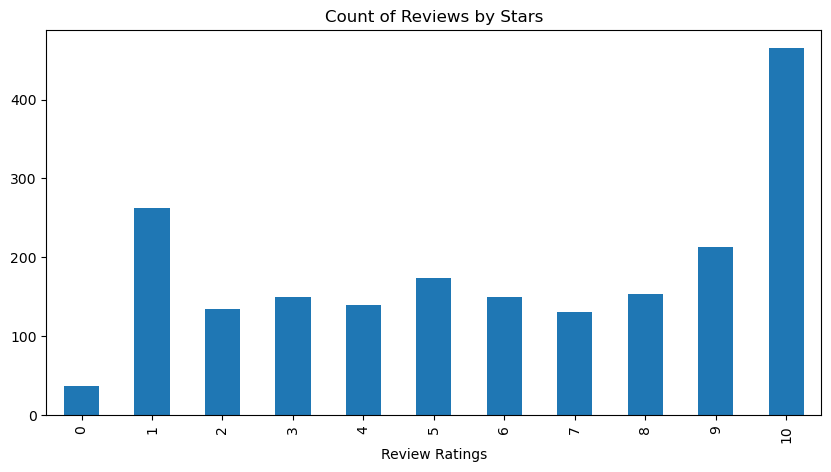

In [15]:
ax = df['rating'].value_counts().sort_index() \
    .plot(kind='bar',
          title='Count of Reviews by Stars',
          figsize=(10, 5))
ax.set_xlabel('Review Ratings')
plt.show()


In [16]:
df[['numerator', 'denominator']] = df['helpfullness'].str.split('/', expand=True).astype(float)

# Step 2: Calculate the percentage
df['helpfullness_percentage'] = (df['numerator'] / df['denominator']) * 100

# Step 3: Round to 2 decimal places
df['helpfullness_percentage'] = df['helpfullness_percentage'].round(2)
df = df.drop(['numerator', 'denominator'], axis=1)

In [17]:
def categorize_percentage(value):
    if value <= 35:
        return 0
    elif 35 < value <= 65:
        return 1
    elif 65 < value <=100:
        return 2
    else:
        return(None)

# Apply the function to create a new 'category' column
df['label'] = df['helpfullness_percentage'].apply(categorize_percentage)

In [18]:
df

,rating,user_title_review,user_title_review_content,helpfullness,title_word_count,content_word_count,helpfullness_percentage,label
0,8,A past that erupts,A mythical kingdom where raw natures of human ...,71/91,4,104.0,78.02,2.0
1,8,HOTD Season One,None,None,3,NaN,NaN,NaN
2,9,Fantasy done right,It's refreshing to know that there are still s...,23/28,3,125.0,82.14,2.0
3,6,Incohesive,The first few episodes were quite promising. I...,481/691,1,223.0,69.61,2.0
4,6,Competent production struggeling for relevance,None,None,5,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2003,1,boring start,"I just hope its going to be better, becouse th...",0/2,2,44.0,0.00,0.0
2004,0,The lighting spoils it. Candles?? Seriously...,None,None,6,NaN,NaN,NaN
2005,0,House Of The Dragon follows an ugly Game Of Th...,The king meets with Corlys in the throne room ...,0/3,11,195.0,0.00,0.0
2006,0,Trying to push the LGBTQ and FEMINISM and othe...,None,None,11,NaN,NaN,NaN


In [19]:
df['label'].value_counts()

1.0    919
0.0    461
2.0    108
Name: label, dtype: int64

In [20]:
df.isnull().sum()

rating                         0
user_title_review              0
user_title_review_content    510
helpfullness                 510
title_word_count               0
content_word_count           510
helpfullness_percentage      513
label                        520
dtype: int64

In [21]:
dfh = df.dropna(subset=['label']).copy()
dfh = dfh.drop(columns='helpfullness')

In [22]:
dfh.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1488 entries, 0 to 2005
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   rating                     1488 non-null   int32  
 1   user_title_review          1488 non-null   object 
 2   user_title_review_content  1488 non-null   object 
 3   title_word_count           1488 non-null   int64  
 4   content_word_count         1488 non-null   float64
 5   helpfullness_percentage    1488 non-null   float64
 6   label                      1488 non-null   float64
dtypes: float64(3), int32(1), int64(1), object(2)
memory usage: 87.2+ KB


In [23]:
dfh[['content_word_count','label']] = dfh[['content_word_count','label']].astype(int)

In [24]:
dfh

,rating,user_title_review,user_title_review_content,title_word_count,content_word_count,helpfullness_percentage,label
0,8,A past that erupts,A mythical kingdom where raw natures of human ...,4,104,78.02,2
2,9,Fantasy done right,It's refreshing to know that there are still s...,3,125,82.14,2
3,6,Incohesive,The first few episodes were quite promising. I...,1,223,69.61,2
6,10,The entertainment in the second season of this...,The complexity of the House of the Dragon (Sea...,12,229,100.00,2
7,10,Not as good as GoT but still good,Game of Thrones was one of my favorite shows o...,8,171,84.85,2
...,...,...,...,...,...,...,...
1999,5,Good so far,The House of the Dragons. Is a good start to a...,3,123,10.53,0
2000,4,Wow one big English soap opra.,I loved GOT and would rate that a 10 but HOD i...,6,126,14.29,0
2001,5,I wanted to like it....,I really wanted to like it cause I adored GOT....,5,210,0.00,0
2003,1,boring start,"I just hope its going to be better, becouse th...",2,44,0.00,0


In [25]:
dfh.isnull().sum()

rating                       0
user_title_review            0
user_title_review_content    0
title_word_count             0
content_word_count           0
helpfullness_percentage      0
label                        0
dtype: int64

In [26]:
dfh['label'].value_counts()

1    919
0    461
2    108
Name: label, dtype: int64

In [27]:
label_titleanalysis = pd.crosstab(dfh['title_word_count'],dfh['label'])
label_titleanalysis

label,0,1,2
title_word_count,,,
1,54,104,8
2,74,126,9
3,77,126,18
4,71,129,17
5,58,108,11
6,43,84,16
7,19,67,7
8,20,53,9
9,14,41,3


<AxesSubplot:xlabel='title_word_count'>

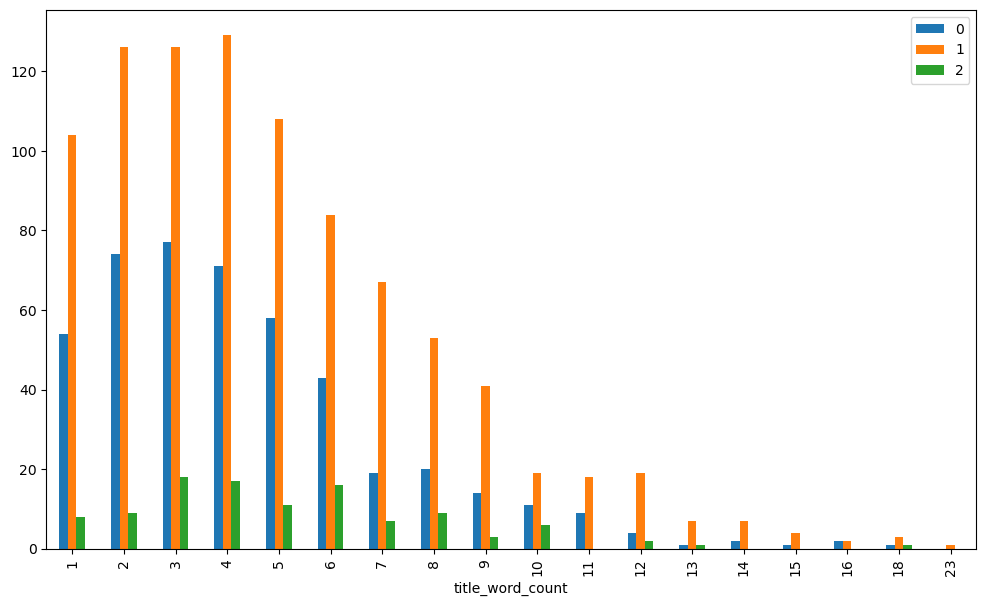

In [28]:
latitanalysis = label_titleanalysis.reset_index()
latitanalysis.columns = ['title_word_count','0', '1', '2']
latitanalysis.iloc[:-1].plot(x="title_word_count", y=["0", "1","2"], kind="bar",figsize=(12,7))

In [29]:
label_titleanalysis.describe()

label,0,1,2
count,19.000000,19.000000,19.000000
mean,24.263158,48.368421,5.684211
std,28.456286,49.234372,6.245466
min,0.000000,1.000000,0.000000
25%,1.500000,5.500000,0.000000
50%,11.000000,19.000000,3.000000
75%,48.500000,94.000000,9.000000
max,77.000000,129.000000,18.000000


In [30]:
dfh['title_word_count'].describe()

count    1488.000000
mean        4.814516
std         3.146588
min         1.000000
25%         2.000000
50%         4.000000
75%         6.000000
max        25.000000
Name: title_word_count, dtype: float64

#Insight 1: Jumlah kata dari title_word_count semakin dikit, semakin helpfull

In [31]:
label_contentanalysis = pd.crosstab(dfh['content_word_count'],dfh['label'])
label_contentanalysis

label,0,1,2
content_word_count,,,
14,0,1,0
19,0,1,0
23,1,1,0
24,1,0,0
25,2,0,0
...,...,...,...
935,0,1,0
989,0,0,1
1011,1,0,0


In [32]:
label_contentanalysis.describe()

label,0,1,2
count,272.000000,272.000000,272.000000
mean,1.694853,3.378676,0.397059
std,2.193308,4.495178,0.789969
min,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000
50%,1.000000,1.500000,0.000000
75%,3.000000,4.000000,1.000000
max,14.000000,24.000000,4.000000


In [33]:
dfh['content_word_count'].describe()

count    1488.000000
mean      129.075269
std       108.708607
min        14.000000
25%        84.000000
50%       117.000000
75%       139.000000
max      1654.000000
Name: content_word_count, dtype: float64

#Insight 2: Jumlah kata di Content lebih sedikit, maka lebih helpfull

In [34]:
dfh['label'].value_counts()

1    919
0    461
2    108
Name: label, dtype: int64

In [35]:
label_title_analysis2 = pd.crosstab(dfh['label'],dfh['title_word_count'])
label_title_analysis2

title_word_count,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,23,25
label,,,,,,,,,,,,,,,,,,,
0,54,74,77,71,58,43,19,20,14,11,9,4,1,2,1,2,1,0,0
1,104,126,126,129,108,84,67,53,41,19,18,19,7,7,4,2,3,1,1
2,8,9,18,17,11,16,7,9,3,6,0,2,1,0,0,0,1,0,0


In [36]:
dfh

,rating,user_title_review,user_title_review_content,title_word_count,content_word_count,helpfullness_percentage,label
0,8,A past that erupts,A mythical kingdom where raw natures of human ...,4,104,78.02,2
2,9,Fantasy done right,It's refreshing to know that there are still s...,3,125,82.14,2
3,6,Incohesive,The first few episodes were quite promising. I...,1,223,69.61,2
6,10,The entertainment in the second season of this...,The complexity of the House of the Dragon (Sea...,12,229,100.00,2
7,10,Not as good as GoT but still good,Game of Thrones was one of my favorite shows o...,8,171,84.85,2
...,...,...,...,...,...,...,...
1999,5,Good so far,The House of the Dragons. Is a good start to a...,3,123,10.53,0
2000,4,Wow one big English soap opra.,I loved GOT and would rate that a 10 but HOD i...,6,126,14.29,0
2001,5,I wanted to like it....,I really wanted to like it cause I adored GOT....,5,210,0.00,0
2003,1,boring start,"I just hope its going to be better, becouse th...",2,44,0.00,0


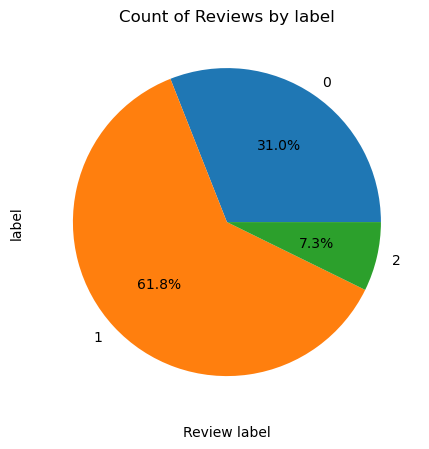

In [37]:
bx = dfh['label'].value_counts().sort_index() \
    .plot(kind='pie',
          title='Count of Reviews by label',
          autopct="%1.1f%%",
          figsize=(10, 5))
bx.set_xlabel('Review label')
plt.show()


[Text(0.5, 1.0, 'Distribution of length of review if label = 0')]

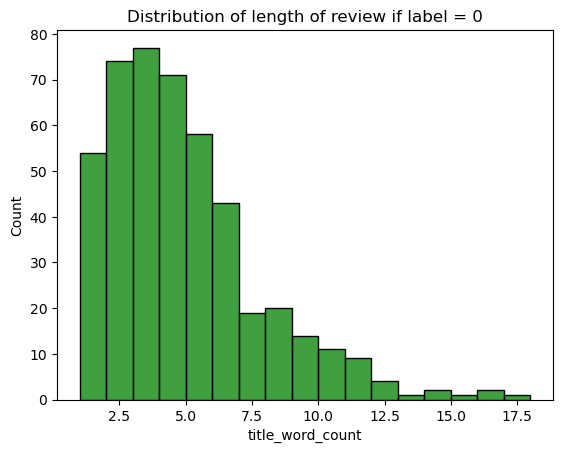

In [38]:
sns.histplot(dfh[dfh['label']==0]['title_word_count'],color='green').set(title='Distribution of length of review if label = 0')

[Text(0.5, 1.0, 'Distribution of length of review if label = 1')]

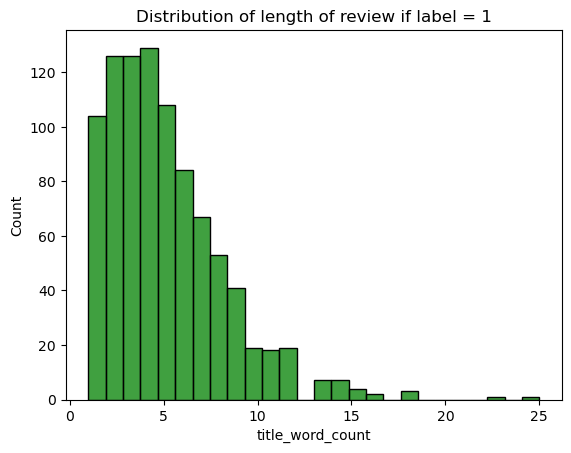

In [39]:
sns.histplot(dfh[dfh['label']==1]['title_word_count'],color='green').set(title='Distribution of length of review if label = 1')

[Text(0.5, 1.0, 'Distribution of length of review if label = 2')]

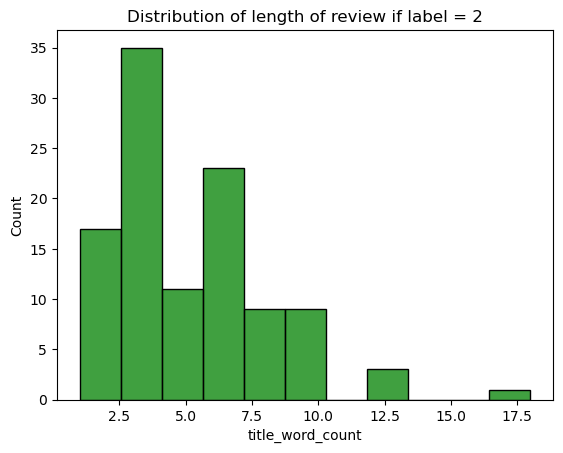

In [40]:
sns.histplot(dfh[dfh['label']==2]['title_word_count'],color='green').set(title='Distribution of length of review if label = 2')

[Text(0.5, 1.0, 'Distribution of length of review if label = 0')]

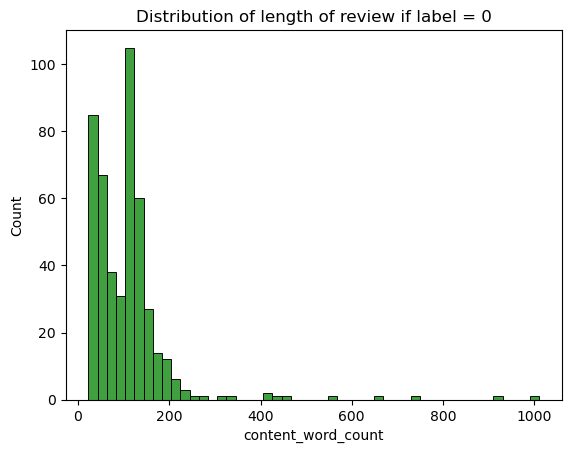

In [41]:
sns.histplot(dfh[dfh['label']==0]['content_word_count'],color='green').set(title='Distribution of length of review if label = 0')

[Text(0.5, 1.0, 'Distribution of length of review if label = 1')]

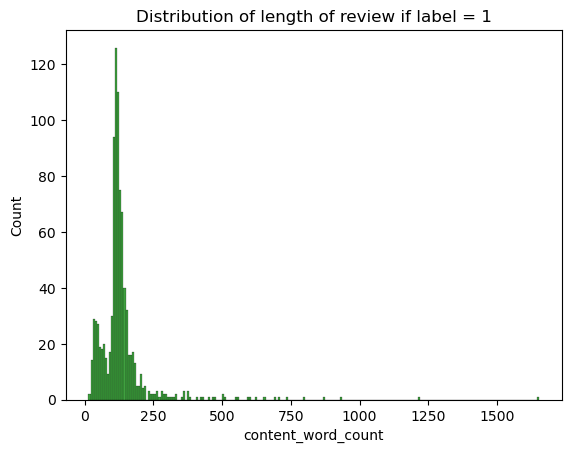

In [42]:
sns.histplot(dfh[dfh['label']==1]['content_word_count'],color='green').set(title='Distribution of length of review if label = 1')

[Text(0.5, 1.0, 'Distribution of length of review if label = 2')]

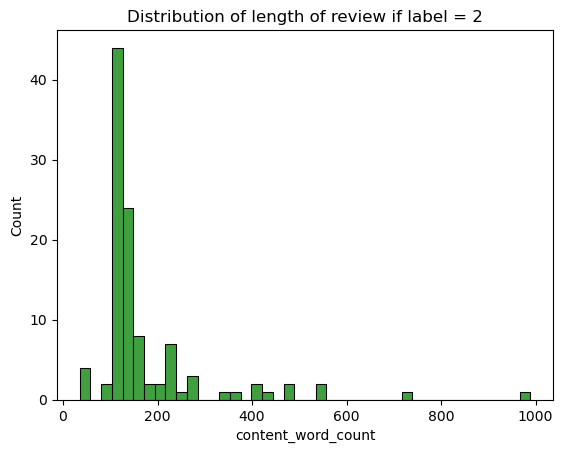

In [43]:
sns.histplot(dfh[dfh['label']==2]['content_word_count'],color='green').set(title='Distribution of length of review if label = 2')

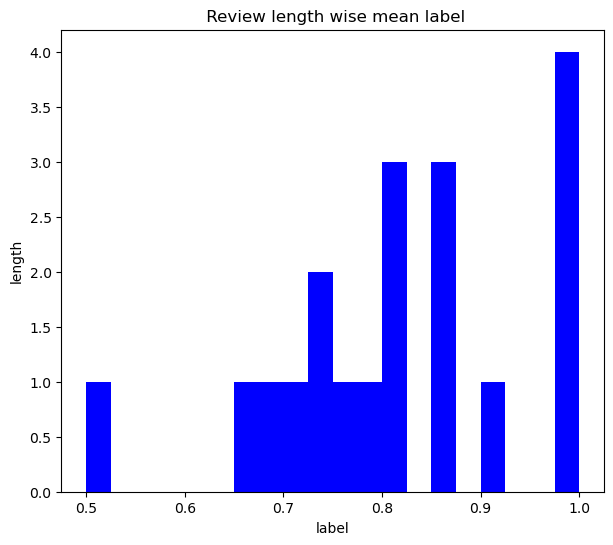

In [44]:
dfh.groupby('title_word_count')['label'].mean().plot.hist(color = 'blue', figsize=(7, 6), bins = 20)
plt.title(" Review length wise mean label")
plt.xlabel('label')
plt.ylabel('length')
plt.show()

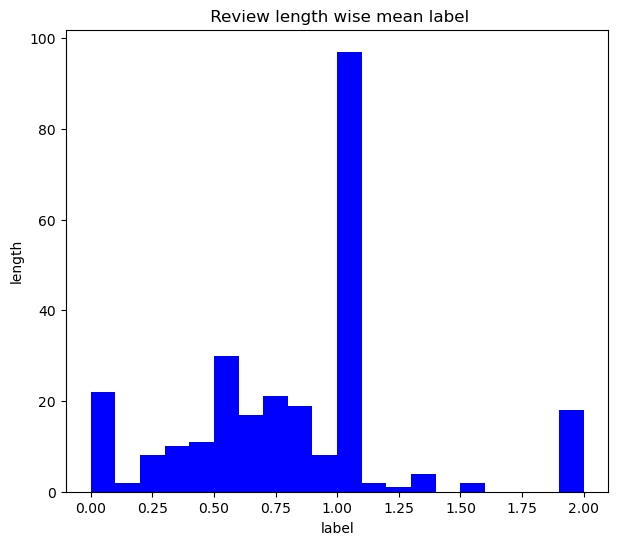

In [45]:
dfh.groupby('content_word_count')['label'].mean().plot.hist(color = 'blue', figsize=(7, 6), bins = 20)
plt.title(" Review length wise mean label")
plt.xlabel('label')
plt.ylabel('length')
plt.show()

In [46]:
dfh['content_word_count'].describe()

count    1488.000000
mean      129.075269
std       108.708607
min        14.000000
25%        84.000000
50%       117.000000
75%       139.000000
max      1654.000000
Name: content_word_count, dtype: float64

In [47]:
dfh.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1488 entries, 0 to 2005
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   rating                     1488 non-null   int32  
 1   user_title_review          1488 non-null   object 
 2   user_title_review_content  1488 non-null   object 
 3   title_word_count           1488 non-null   int64  
 4   content_word_count         1488 non-null   int32  
 5   helpfullness_percentage    1488 non-null   float64
 6   label                      1488 non-null   int32  
dtypes: float64(1), int32(3), int64(1), object(2)
memory usage: 75.6+ KB


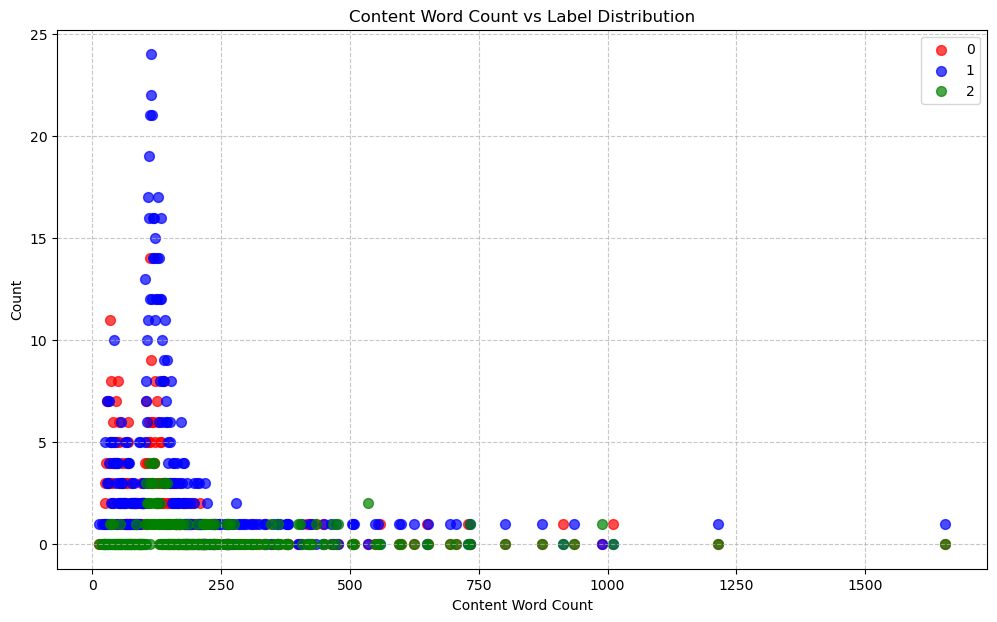

In [48]:
label_coneanalysis = pd.crosstab(dfh['content_word_count'],df['label'])
laconanalysis = label_coneanalysis.reset_index()
laconanalysis.columns = ['content_word_count','0', '1', '2']
fig, ax = plt.subplots(figsize=(12, 7))

ax.scatter(laconanalysis['content_word_count'], laconanalysis['0'], label='0', alpha=0.7, c='red', s=50)
ax.scatter(laconanalysis['content_word_count'], laconanalysis['1'], label='1', alpha=0.7, c='blue', s=50)
ax.scatter(laconanalysis['content_word_count'], laconanalysis['2'], label='2', alpha=0.7, c='green', s=50)

ax.set_xlabel('Content Word Count')
ax.set_ylabel('Count')
ax.set_title('Content Word Count vs Label Distribution')
ax.legend()
ax.grid(True, linestyle='--', alpha=0.7)

plt.show()

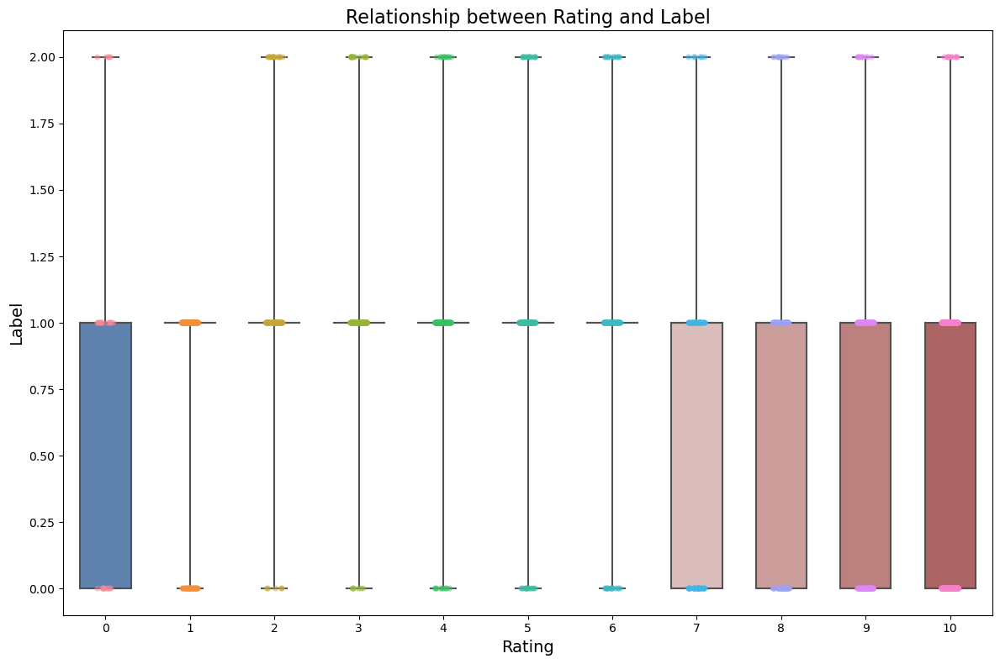

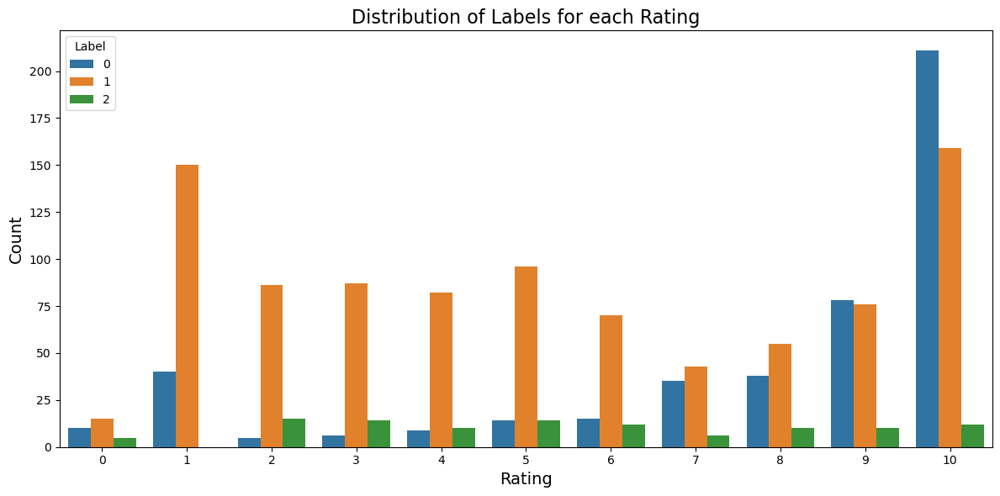

In [49]:
plt.figure(figsize=(12, 8))

# Create a scatter plot with jitter
sns.stripplot(x='rating', y='label', data=dfh, jitter=True, alpha=0.5)

# Add a box plot
sns.boxplot(x='rating', y='label', data=dfh, whis=[0, 100], width=0.6, palette="vlag")

# Customize the plot
plt.title('Relationship between Rating and Label', fontsize=16)
plt.xlabel('Rating', fontsize=14)
plt.ylabel('Label', fontsize=14)

# Show the plot
plt.tight_layout()
plt.show()

# Optional: Add a count plot to show the distribution of labels for each rating
plt.figure(figsize=(12, 6))
sns.countplot(x='rating', hue='label', data=dfh)
plt.title('Distribution of Labels for each Rating', fontsize=16)
plt.xlabel('Rating', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Label')
plt.tight_layout()
plt.show()

In [50]:
correlation0 = dfh['rating'].corr(dfh['label']==0)
correlation1 = dfh['rating'].corr(dfh['label']==1)
correlation2 = dfh['rating'].corr(dfh['label']==2)
print(f"Correlation between rating and label 0: {correlation0:.2f}, label 1: {correlation1:.2f}, label 2: {correlation2:.2f}")

Correlation between rating and label 0: 0.35, label 1: -0.31, label 2: -0.05


#Insight 3: Semakin naik jumlah rating, label 0 cenderung naik, label 1 bisa dibilang tidak berpengaruh dan label 2 stabil

In [51]:
cv = CountVectorizer(stop_words='english')
words = cv.fit_transform(dfh.user_title_review)

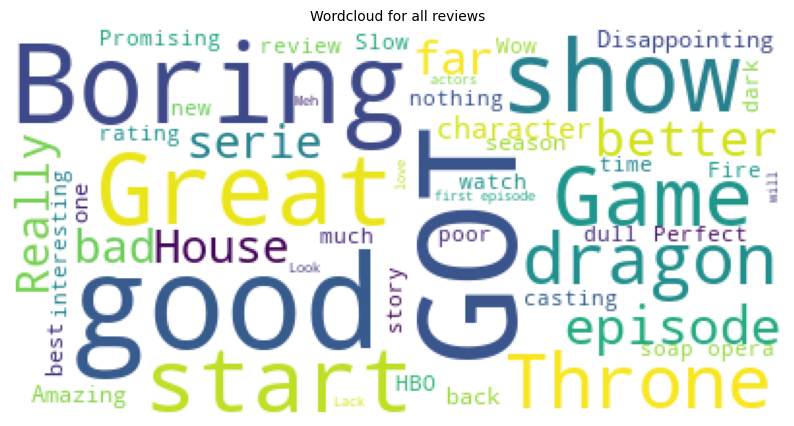

In [52]:
    # Combine all reviews
reviews = " ".join([review for review in dfh['user_title_review']])
                        
# Initialize wordcloud object
wc = WordCloud(background_color='white', max_words=50)

# Generate and plot wordcloud
plt.figure(figsize=(10,10))
plt.imshow(wc.generate(reviews))
plt.title('Wordcloud for all reviews', fontsize=10)
plt.axis('off')
plt.show()

In [53]:
# Combine all reviews for each feedback category and splitting them into individual words
neg_reviews = " ".join([review for review in dfh[dfh['label'] == 0]['user_title_review']])
neg_reviews = neg_reviews.lower().split()

net_reviews = " ".join([review for review in dfh[dfh['label'] == 1]['user_title_review']])
net_reviews = net_reviews.lower().split()

pos_reviews = " ".join([review for review in dfh[dfh['label'] == 2]['user_title_review']])
pos_reviews = pos_reviews.lower().split()

#Finding words from reviews which are present in that feedback category only
unique_negative = [x for x in neg_reviews if x not in [pos_reviews,net_reviews]]
unique_negative = " ".join(unique_negative)

unique_neutral = [x for x in net_reviews if x not in [neg_reviews,pos_reviews]]
unique_neutral = " ".join(unique_neutral)

unique_positive = [x for x in pos_reviews if x not in [net_reviews,neg_reviews]]
unique_positive = " ".join(unique_positive)

In [54]:
unique_neutral

'meh, a soap opera with good production value, but lacks compelling plot really good spin-off, but not special great look but limited with single story and characters in night scenes you can\'t see anything the next big thing looks promising illogical reviews 10/10 tv-show - 0/10 cgi not bad but disappointing a pretty solid series but quite slow paced at times peak got fire will reign. if you like game of thrones you will like this. where are the characters? nice story pleasant to watch action drama movie promising start, then each episode got worse grows better for every episode the aging was really off good series always waiting for more to happen, but it\'s just too boring respectful effort into the series - self references only (no spoilers) exceeded my expectation something is missing... a pearl among pebbles time wasting, lazy, and repetitive. one of the best things so far... interesting from start to finish it\'s really... not that great. haters gonna hate first episode feels li

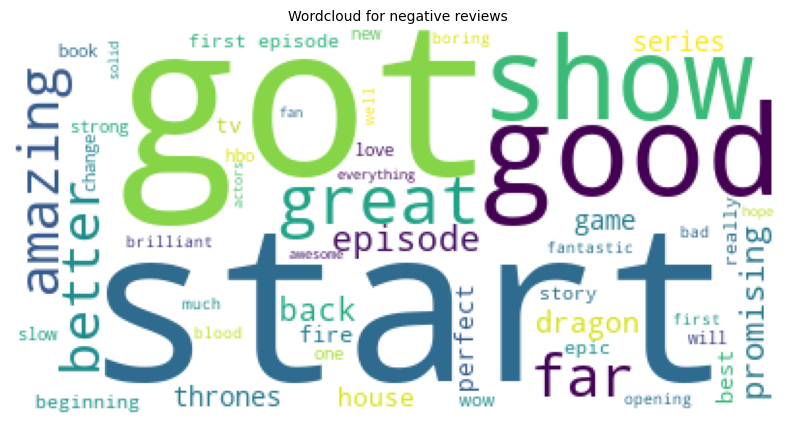

In [55]:
# Generate and plot wordcloud
plt.figure(figsize=(10,10))
plt.imshow(wc.generate(unique_negative))
plt.title('Wordcloud for negative reviews', fontsize=10)
plt.axis('off')
plt.show()

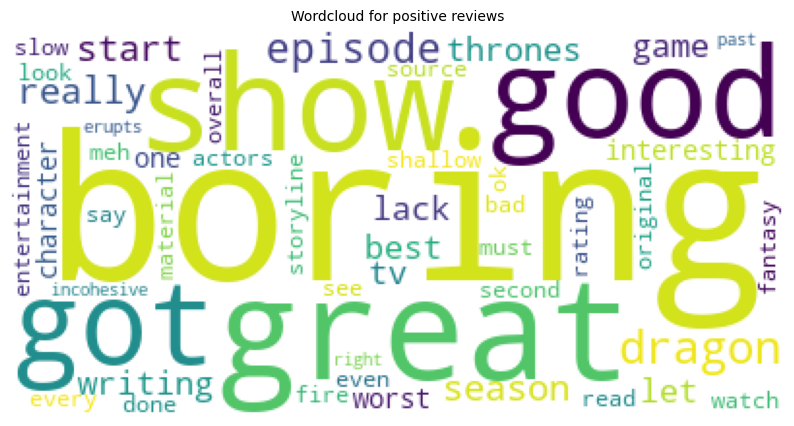

In [56]:
# Generate and plot wordcloud
plt.figure(figsize=(10,10))
plt.imshow(wc.generate(unique_positive))
plt.title('Wordcloud for positive reviews', fontsize=10)
plt.axis('off')
plt.show()

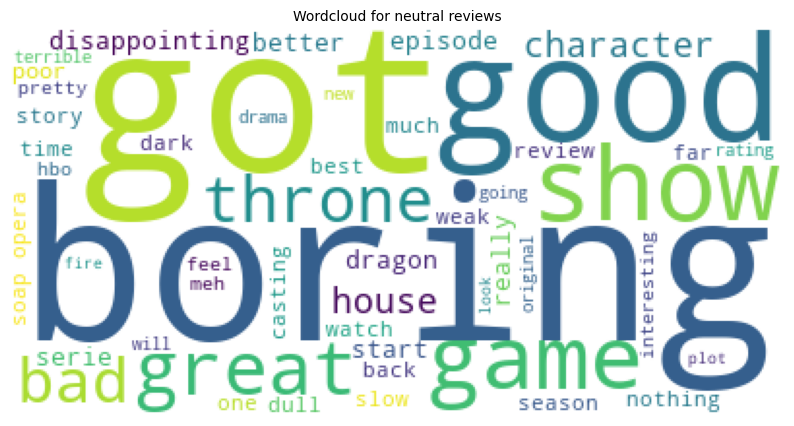

In [57]:
# Generate and plot wordcloud
plt.figure(figsize=(10,10))
plt.imshow(wc.generate(unique_neutral))
plt.title('Wordcloud for neutral reviews', fontsize=10)
plt.axis('off')
plt.show()

In [58]:
# Combine all reviews for each feedback category and splitting them into individual words
neg_con = " ".join([review for review in dfh[dfh['label'] == 0]['user_title_review_content']])
neg_con = neg_con.lower().split()

net_con = " ".join([review for review in dfh[dfh['label'] == 1]['user_title_review_content']])
net_con = net_con.lower().split()

pos_con = " ".join([review for review in dfh[dfh['label'] == 2]['user_title_review_content']])
pos_con = pos_con.lower().split()

#Finding words from reviews which are present in that feedback category only
uniquecon_negative = [x for x in neg_con if x not in [pos_con,net_con]]
uniquecon_negative = " ".join(uniquecon_negative)

uniquecon_neutral = [x for x in net_con if x not in [pos_con,neg_con]]
uniquecon_neutral = " ".join(uniquecon_neutral)

uniquecon_positive = [x for x in pos_con if x not in [neg_con,net_con]]
uniquecon_positive = " ".join(uniquecon_positive)

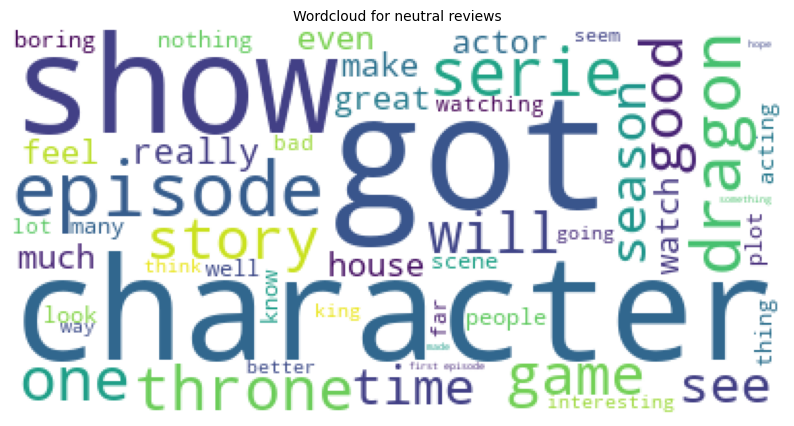

In [59]:
# Generate and plot wordcloud
plt.figure(figsize=(10,10))
plt.imshow(wc.generate(uniquecon_neutral))
plt.title('Wordcloud for neutral reviews', fontsize=10)
plt.axis('off')
plt.show()

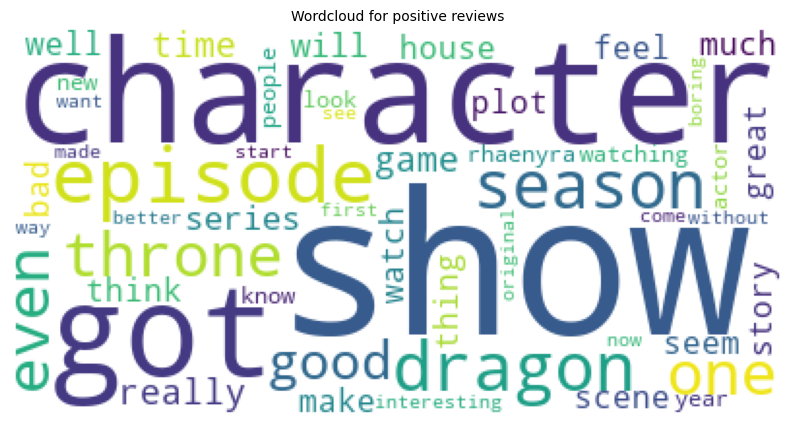

In [60]:
# Generate and plot wordcloud
plt.figure(figsize=(10,10))
plt.imshow(wc.generate(uniquecon_positive))
plt.title('Wordcloud for positive reviews', fontsize=10)
plt.axis('off')
plt.show()

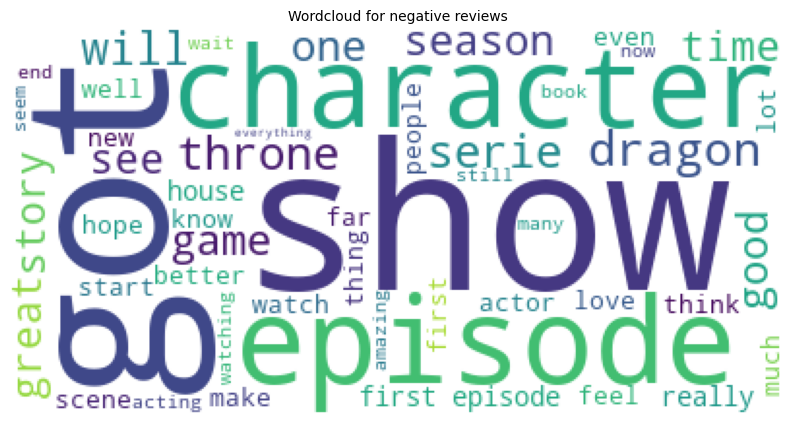

In [61]:
# Generate and plot wordcloud
plt.figure(figsize=(10,10))
plt.imshow(wc.generate(uniquecon_negative))
plt.title('Wordcloud for negative reviews', fontsize=10)
plt.axis('off')
plt.show()

In [62]:
sia = SentimentIntensityAnalyzer()

In [63]:
sia.polarity_scores('Fantasy done right')


{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

In [64]:
sia.polarity_scores('Has Potential, but Lacks Someone to Root For.')

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

In [65]:
sia.polarity_scores('This is the worst thing ever.')

{'neg': 0.451, 'neu': 0.549, 'pos': 0.0, 'compound': -0.6249}

In [66]:
example = df['user_title_review_content'][50]
print(example)

Game of Thrones was special. It had families from all over a fantasy world. The families had likeable characters who you routed for. It had the wall, the nights watch, dragons, and MAGIC to top it all. Each character was interesting and then the show really took off when the character's storylines started to intertwine.House of the Dragon, simply has dragons. I'm not sure who to route for, it's almost a show made up of villains. Maybe that's the point? Either way, where is the magic? One house is not enough to make me look forward to future seasons. The show is really well made, and it's fun to watch, but in the end it's kind of forgettable. This show is good, but not special.


In [67]:
tokens = nltk.word_tokenize(example)
tokens[:10]

['Game',
 'of',
 'Thrones',
 'was',
 'special',
 '.',
 'It',
 'had',
 'families',
 'from']

In [68]:
tagged = nltk.pos_tag(tokens)
tagged[:10]

[('Game', 'NN'),
 ('of', 'IN'),
 ('Thrones', 'NNP'),
 ('was', 'VBD'),
 ('special', 'JJ'),
 ('.', '.'),
 ('It', 'PRP'),
 ('had', 'VBD'),
 ('families', 'NNS'),
 ('from', 'IN')]

In [69]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [70]:
def get_pos_tags(text):
    # Tokenize the text
    tokens = word_tokenize(text)
    
    # Perform POS tagging
    pos_tags = pos_tag(tokens)
    
    # Extract just the tags
    tags = [tag for word, tag in pos_tags]
    
    return tags

In [71]:
all_tags = []
for text in dfh['user_title_review']:
    tags = get_pos_tags(text)
    all_tags.extend(tags)

# Count the occurrences of each tag
tag_counts = Counter(all_tags)

# Print the results
for tag, count in tag_counts.most_common():
    print(f"{tag}: {count}")

NN: 1173
NNP: 962
JJ: 741
RB: 703
DT: 653
IN: 596
.: 515
PRP: 299
NNS: 281
VB: 247
VBG: 239
CC: 226
,: 200
VBZ: 197
VBP: 141
VBD: 133
TO: 125
CD: 124
VBN: 114
:: 96
MD: 73
JJR: 50
WP: 43
WRB: 41
JJS: 35
RP: 27
PRP$: 27
RBR: 24
POS: 20
'': 14
WDT: 12
``: 12
(: 10
): 10
UH: 8
PDT: 7
RBS: 7
NNPS: 6
EX: 6
SYM: 3
#: 2
FW: 1
$: 1


In [72]:
all_tagscon = []
for text in dfh['user_title_review_content']:
    tags = get_pos_tags(text)
    all_tagscon.extend(tags)

# Count the occurrences of each tag
tag_counts = Counter(all_tagscon)

# Print the results
for tag, count in tag_counts.most_common():
    print(f"{tag}: {count}")

NN: 27230
DT: 21762
IN: 20909
JJ: 15839
RB: 14796
PRP: 12473
.: 10786
NNP: 9750
NNS: 9220
CC: 8451
VB: 8370
VBZ: 7839
,: 7256
VBP: 6454
VBD: 5942
TO: 4794
VBG: 4558
VBN: 3473
MD: 2686
CD: 2449
PRP$: 1815
:: 1235
WRB: 1150
WP: 1088
JJR: 962
WDT: 896
RP: 861
EX: 706
POS: 557
JJS: 544
): 523
(: 487
RBR: 469
'': 358
``: 328
PDT: 285
NNPS: 130
RBS: 115
UH: 92
FW: 50
$: 27
#: 17
WP$: 9
SYM: 1


In [73]:
# Function to count adjectives (JJ tags)
def count_adjectives(text):
    tokens = word_tokenize(text)
    tagged = pos_tag(tokens)
    adjectives = [word for word, tag in tagged if tag.startswith('JJ')]
    return len(adjectives)

# Function to count noun,singular (NN tags)
def count_noun(text):
    tokens = word_tokenize(text)
    tagged = pos_tag(tokens)
    noun = [word for word, tag in tagged if tag.startswith('NN')]
    return len(noun)

# Function to count noun,plural (NNP tags)
def count_nounplural(text):
    tokens = word_tokenize(text)
    tagged = pos_tag(tokens)
    nounplural = [word for word, tag in tagged if tag.startswith('NNP')]
    return len(nounplural)

# Function to count adverb (RB tags)
def count_adverb(text):
    tokens = word_tokenize(text)
    tagged = pos_tag(tokens)
    adverb = [word for word, tag in tagged if tag.startswith('RB')]
    return len(adverb)

# Function to count determiner (DT tags)
def count_determiner(text):
    tokens = word_tokenize(text)
    tagged = pos_tag(tokens)
    determiner = [word for word, tag in tagged if tag.startswith('DT')]
    return len(determiner)

In [74]:
# Define POS tags for different categories
adjectives = {'JJ', 'JJR', 'JJS'}
nouns = {'NN', 'NNP', 'NNPS', 'NNS'}
adverbs = {'RB', 'RBR', 'RBS'}
determiners = {'DT'}
verbs = {'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ'}

In [75]:
def count_pos_tags(text, pos_tags):
    tokens = word_tokenize(text)
    tagged = pos_tag(tokens)
    count = sum(1 for word, tag in tagged if tag in pos_tags)
    return count

In [76]:
# Apply functions to count POS tags for titles and contents
dfh['num_adjectives_title'] = dfh['user_title_review'].apply(lambda x: count_pos_tags(x, adjectives))
dfh['num_adjectives_content'] = dfh['user_title_review_content'].apply(lambda x: count_pos_tags(x, adjectives))
dfh['num_noun_title'] = dfh['user_title_review'].apply(lambda x: count_pos_tags(x, nouns))
dfh['num_noun_content'] = dfh['user_title_review_content'].apply(lambda x: count_pos_tags(x, nouns))
dfh['num_adverb_title'] = dfh['user_title_review'].apply(lambda x: count_pos_tags(x, adverbs))
dfh['num_adverb_content'] = dfh['user_title_review_content'].apply(lambda x: count_pos_tags(x, adverbs))
dfh['num_determiner_title'] = dfh['user_title_review'].apply(lambda x: count_pos_tags(x, determiners))
dfh['num_determiner_content'] = dfh['user_title_review_content'].apply(lambda x: count_pos_tags(x, determiners))
dfh['num_verb_title'] = dfh['user_title_review'].apply(lambda x: count_pos_tags(x, verbs))
dfh['num_verb_content'] = dfh['user_title_review_content'].apply(lambda x: count_pos_tags(x, verbs))

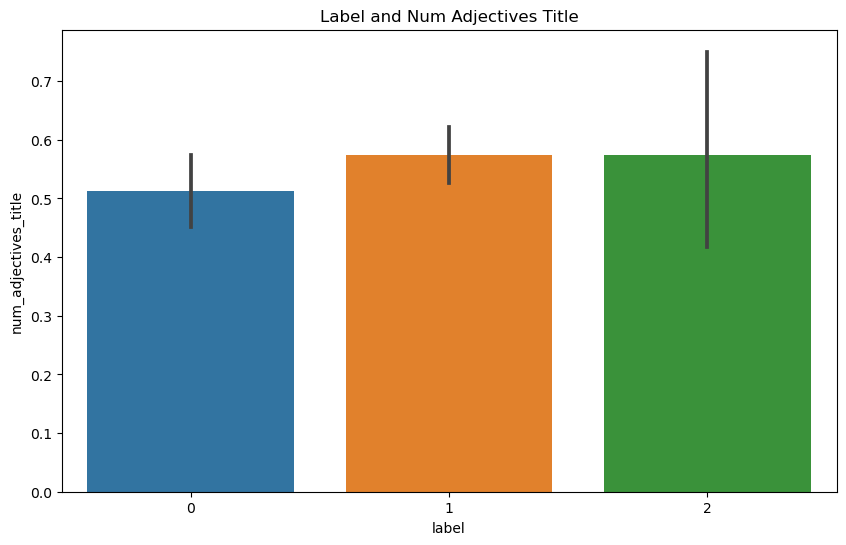

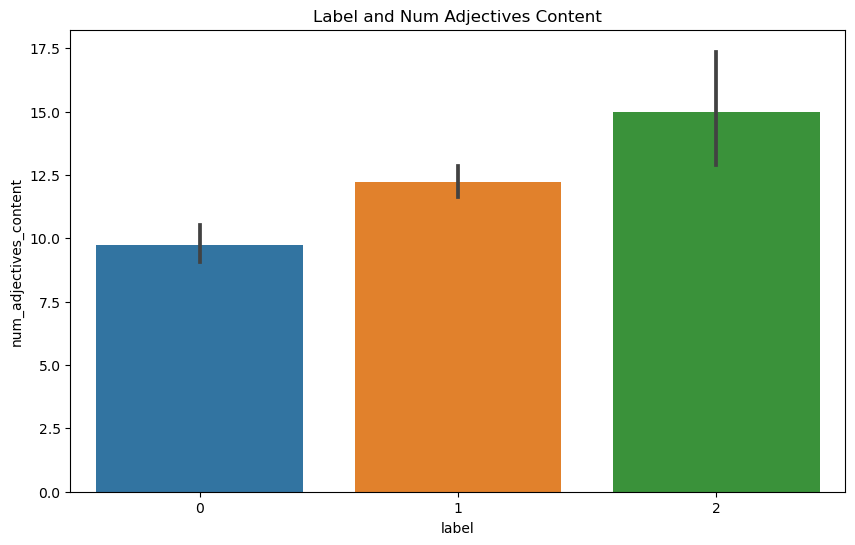

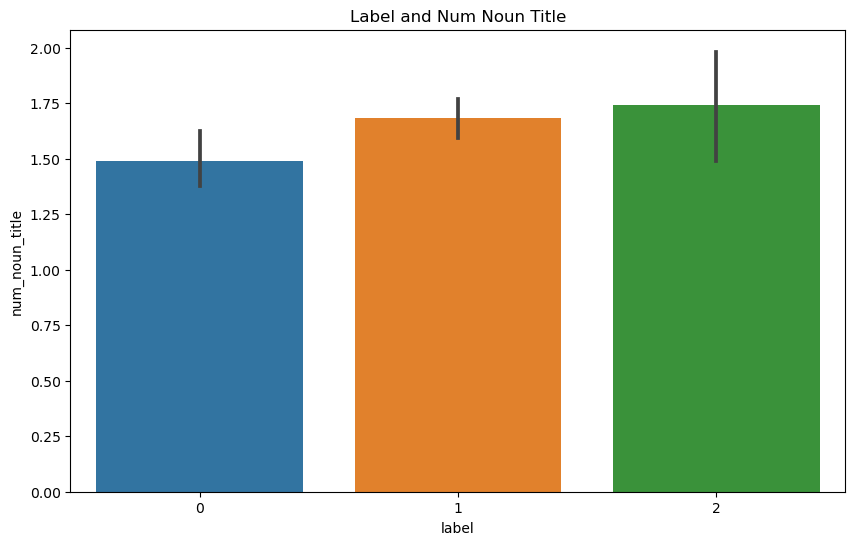

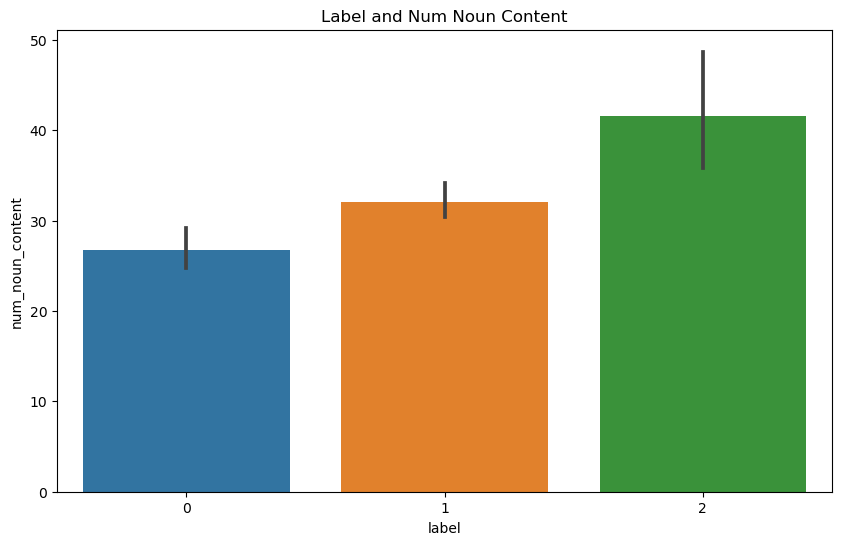

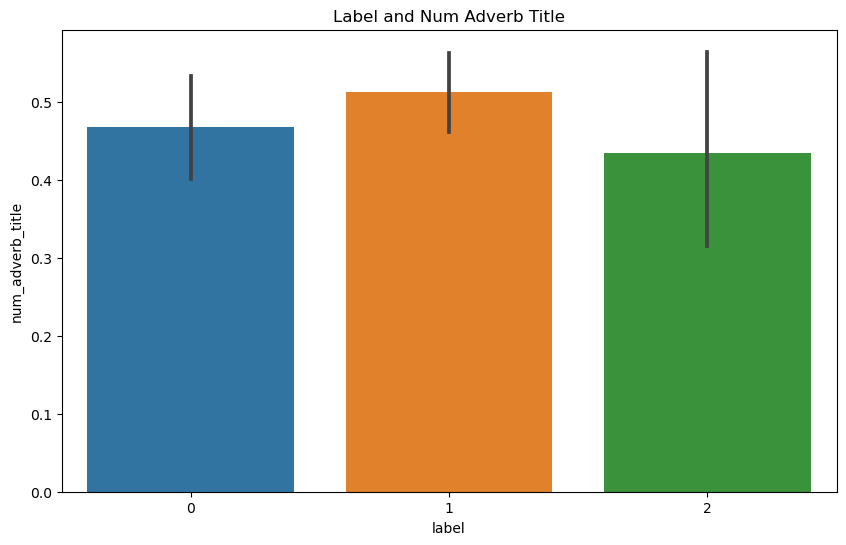

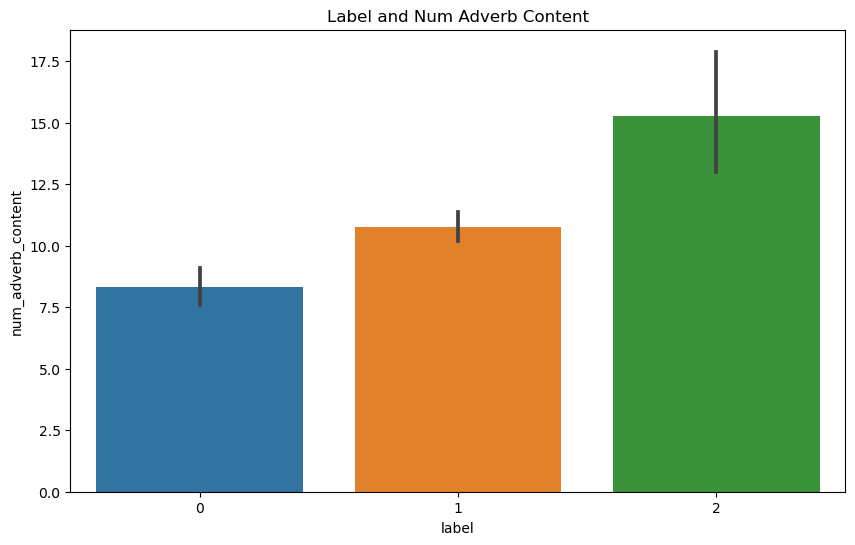

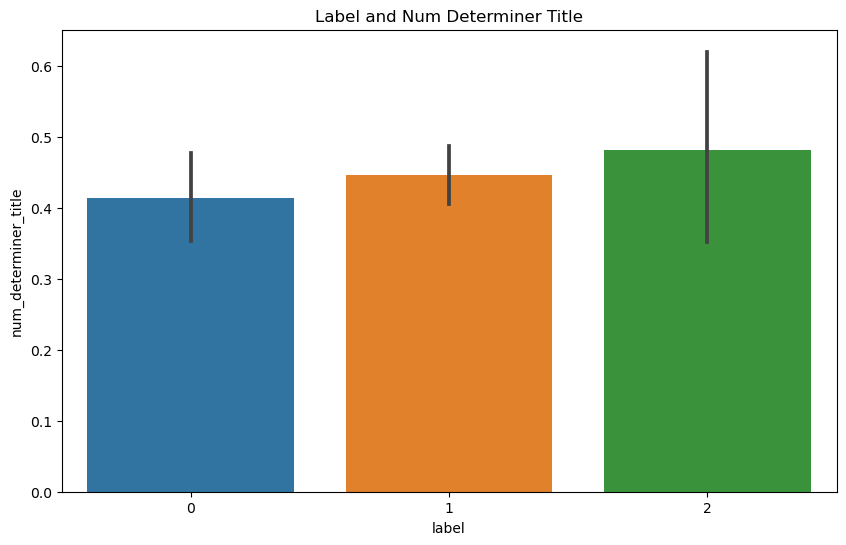

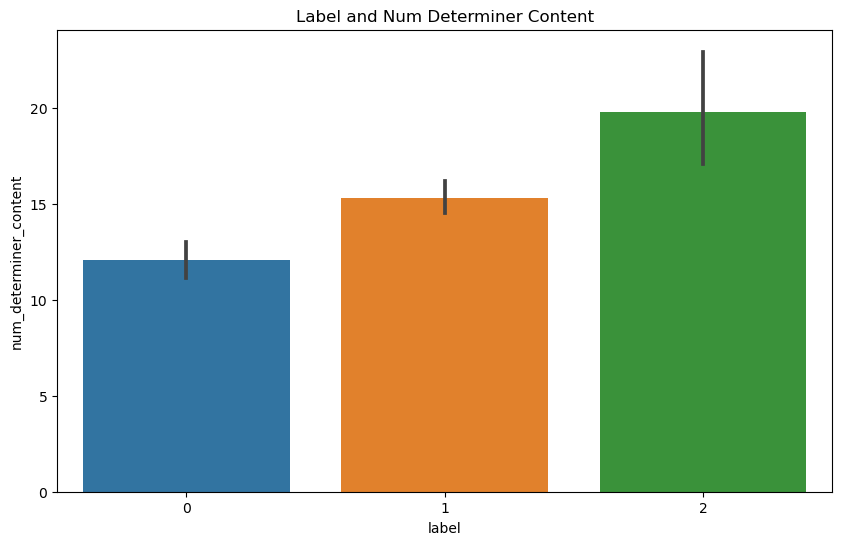

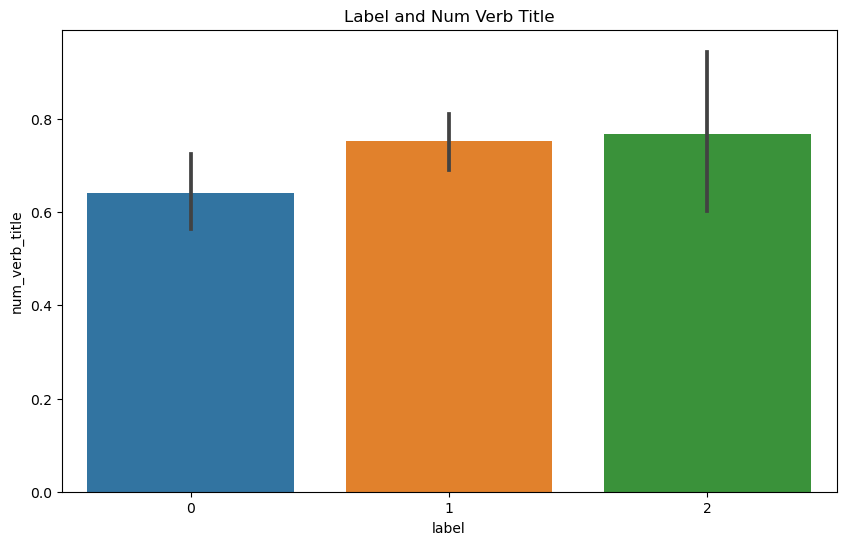

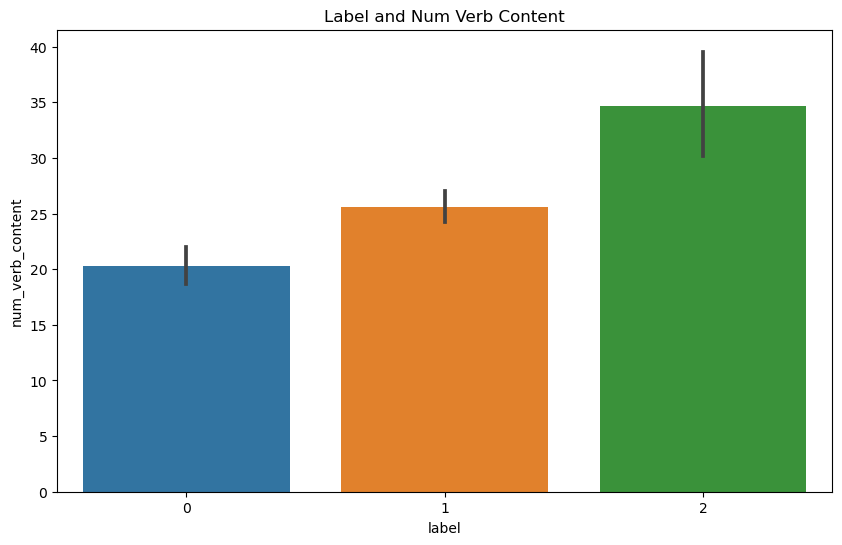

In [77]:
# List of columns to plot
columns_to_plot = [
    'num_adjectives_title', 'num_adjectives_content', 
    'num_noun_title', 'num_noun_content', 
    'num_adverb_title', 'num_adverb_content', 
    'num_determiner_title', 'num_determiner_content', 
    'num_verb_title', 'num_verb_content'
]

# Plotting
for column in columns_to_plot:
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(data=dfh, x='label', y=column)
    ax.set_title(f'Label and {column.replace("_", " ").title()}')
    plt.show()

In [78]:
# Calculate correlation with the 'label' column
correlationtag = dfh[['num_adjectives_title', 'num_adjectives_content', 'num_noun_title', 'num_noun_content', 
                  'num_adverb_title', 'num_adverb_content', 'num_determiner_title', 'num_determiner_content', 
                  'num_verb_title', 'num_verb_content', 'label']].corr()

# Display the correlation with 'label' column
print(correlationtag['label'])

num_adjectives_title      0.035378
num_adjectives_content    0.153419
num_noun_title            0.065306
num_noun_content          0.130617
num_adverb_title          0.007892
num_adverb_content        0.183299
num_determiner_title      0.027773
num_determiner_content    0.164408
num_verb_title            0.052821
num_verb_content          0.177771
label                     1.000000
Name: label, dtype: float64


In [79]:
correlation_data = {'Column': [], 'Correlation with Label 0': [], 'Correlation with Label 1': [], 'Correlation with Label 2': []}

for column in columns_to_plot:
    correlation_label_0 = dfh[column].corr(dfh['label'] == 0)
    correlation_label_1 = dfh[column].corr(dfh['label'] == 1)
    correlation_label_2 = dfh[column].corr(dfh['label'] == 2)
    correlation_data['Column'].append(column)
    correlation_data['Correlation with Label 0'].append(correlation_label_0)
    correlation_data['Correlation with Label 1'].append(correlation_label_1)
    correlation_data['Correlation with Label 2'].append(correlation_label_2)

# Convert to DataFrame
correlation_df = pd.DataFrame(correlation_data)

# Display the correlation DataFrame
correlation_df

,Column,Correlation with Label 0,Correlation with Label 1,Correlation with Label 2
0,num_adjectives_title,-0.039614,0.033815,0.007266
1,num_adjectives_content,-0.134918,0.076474,0.097222
2,num_noun_title,-0.067620,0.051944,0.023223
3,num_noun_content,-0.103024,0.042572,0.103878
4,num_adverb_title,-0.021672,0.031969,-0.021255
5,num_adverb_content,-0.144061,0.058762,0.146695
6,num_determiner_title,-0.024373,0.013747,0.017691
7,num_determiner_content,-0.137499,0.068473,0.116809
8,num_verb_title,-0.056868,0.046154,0.014906
9,num_verb_content,-0.142400,0.062098,0.137487


In [80]:
dfh[columns_to_plot].describe()

,num_adjectives_title,num_adjectives_content,num_noun_title,num_noun_content,num_adverb_title,num_adverb_content,num_determiner_title,num_determiner_content,num_verb_title,num_verb_content
count,1488.000000,1488.000000,1488.000000,1488.000000,1488.00000,1488.000000,1488.000000,1488.000000,1488.000000,1488.000000
mean,0.555108,11.656586,1.627688,31.135753,0.49328,10.336022,0.438844,14.625000,0.719758,24.620968
std,0.730488,9.543780,1.362318,28.245282,0.76487,9.374233,0.674462,12.477842,0.915436,20.390872
min,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,7.000000,1.000000,19.000000,0.00000,5.000000,0.000000,8.000000,0.000000,15.000000
50%,0.000000,10.000000,1.000000,27.000000,0.00000,9.000000,0.000000,13.000000,0.000000,22.000000
75%,1.000000,14.000000,2.000000,34.000000,1.00000,13.000000,1.000000,17.000000,1.000000,28.000000
max,4.000000,146.000000,10.000000,467.000000,4.00000,124.000000,4.000000,176.000000,6.000000,269.000000


#Insight 7 dan 8: Helpfullness 2 cenderung punya lebih banyak adjektif dibanding label lain (berdasarkan content). Urutannya (label 2 > label 1 > label 0). Berarti review yg helpfullness cenderung mengemukakan pendapat pribadi nya (tapi berdasarkan angka sebenernya tidak terlalu berpengaruh)

In [81]:
nltk.download('words')
entities = nltk.chunk.ne_chunk(tagged)
entities.pprint()

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


(S
  Game/NN
  of/IN
  (PERSON Thrones/NNP)
  was/VBD
  special/JJ
  ./.
  It/PRP
  had/VBD
  families/NNS
  from/IN
  all/DT
  over/IN
  a/DT
  fantasy/JJ
  world/NN
  ./.
  The/DT
  families/NNS
  had/VBD
  likeable/JJ
  characters/NNS
  who/WP
  you/PRP
  routed/VBD
  for/IN
  ./.
  It/PRP
  had/VBD
  the/DT
  wall/NN
  ,/,
  the/DT
  nights/NNS
  watch/NN
  ,/,
  dragons/NNS
  ,/,
  and/CC
  (ORGANIZATION MAGIC/NNP)
  to/TO
  top/VB
  it/PRP
  all/DT
  ./.
  Each/DT
  character/NN
  was/VBD
  interesting/JJ
  and/CC
  then/RB
  the/DT
  show/NN
  really/RB
  took/VBD
  off/RP
  when/WRB
  the/DT
  character/NN
  's/POS
  storylines/NNS
  started/VBD
  to/TO
  intertwine.House/VB
  of/IN
  the/DT
  (GPE Dragon/NNP)
  ,/,
  simply/RB
  has/VBZ
  dragons/NNS
  ./.
  I/PRP
  'm/VBP
  not/RB
  sure/JJ
  who/WP
  to/TO
  route/VB
  for/IN
  ,/,
  it/PRP
  's/VBZ
  almost/RB
  a/DT
  show/NN
  made/VBD
  up/IN
  of/IN
  villains/NNS
  ./.
  Maybe/RB
  that/DT
  's/VBZ
  the/DT
  point/NN


In [82]:
sia.polarity_scores(example)

{'neg': 0.031, 'neu': 0.832, 'pos': 0.138, 'compound': 0.9105}

In [83]:
dfh['id'] = dfh.reset_index(inplace=True)

In [84]:
dfh.drop(columns=['id'], inplace=True)


In [85]:
dfh.drop(columns=['index'], inplace=True)


In [86]:
dfh.reset_index(inplace=True)


In [87]:
dfh

,index,rating,user_title_review,user_title_review_content,title_word_count,content_word_count,helpfullness_percentage,label,num_adjectives_title,num_adjectives_content,num_noun_title,num_noun_content,num_adverb_title,num_adverb_content,num_determiner_title,num_determiner_content,num_verb_title,num_verb_content
0,0,8,A past that erupts,A mythical kingdom where raw natures of human ...,4,104,78.02,2,1,15,1,34,0,4,1,13,0,12
1,1,9,Fantasy done right,It's refreshing to know that there are still s...,3,125,82.14,2,0,9,2,27,0,10,0,12,1,31
2,2,6,Incohesive,The first few episodes were quite promising. I...,1,223,69.61,2,1,18,0,47,0,25,0,31,0,41
3,3,10,The entertainment in the second season of this...,The complexity of the House of the Dragon (Sea...,12,229,100.00,2,2,22,3,72,1,9,3,29,1,32
4,4,10,Not as good as GoT but still good,Game of Thrones was one of my favorite shows o...,8,171,84.85,2,2,15,1,29,3,19,0,19,0,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1483,1483,5,Good so far,The House of the Dragons. Is a good start to a...,3,123,10.53,0,0,5,1,43,2,2,0,18,0,18
1484,1484,4,Wow one big English soap opra.,I loved GOT and would rate that a 10 but HOD i...,6,126,14.29,0,1,10,4,20,0,15,0,11,0,24
1485,1485,5,I wanted to like it....,I really wanted to like it cause I adored GOT....,5,210,0.00,0,0,7,0,46,0,12,0,19,3,43
1486,1486,1,boring start,"I just hope its going to be better, becouse th...",2,44,0.00,0,1,5,1,9,0,6,0,3,0,13


In [88]:
res = {}
for i, row in tqdm(dfh.iterrows(), total=len(dfh)):
    text = row['user_title_review_content']
    myid = row['index']
    res[myid] = sia.polarity_scores(text)

  0%|          | 0/1488 [00:00<?, ?it/s]

In [89]:
dfh

,index,rating,user_title_review,user_title_review_content,title_word_count,content_word_count,helpfullness_percentage,label,num_adjectives_title,num_adjectives_content,num_noun_title,num_noun_content,num_adverb_title,num_adverb_content,num_determiner_title,num_determiner_content,num_verb_title,num_verb_content
0,0,8,A past that erupts,A mythical kingdom where raw natures of human ...,4,104,78.02,2,1,15,1,34,0,4,1,13,0,12
1,1,9,Fantasy done right,It's refreshing to know that there are still s...,3,125,82.14,2,0,9,2,27,0,10,0,12,1,31
2,2,6,Incohesive,The first few episodes were quite promising. I...,1,223,69.61,2,1,18,0,47,0,25,0,31,0,41
3,3,10,The entertainment in the second season of this...,The complexity of the House of the Dragon (Sea...,12,229,100.00,2,2,22,3,72,1,9,3,29,1,32
4,4,10,Not as good as GoT but still good,Game of Thrones was one of my favorite shows o...,8,171,84.85,2,2,15,1,29,3,19,0,19,0,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1483,1483,5,Good so far,The House of the Dragons. Is a good start to a...,3,123,10.53,0,0,5,1,43,2,2,0,18,0,18
1484,1484,4,Wow one big English soap opra.,I loved GOT and would rate that a 10 but HOD i...,6,126,14.29,0,1,10,4,20,0,15,0,11,0,24
1485,1485,5,I wanted to like it....,I really wanted to like it cause I adored GOT....,5,210,0.00,0,0,7,0,46,0,12,0,19,3,43
1486,1486,1,boring start,"I just hope its going to be better, becouse th...",2,44,0.00,0,1,5,1,9,0,6,0,3,0,13


In [90]:
vaders = pd.DataFrame(res).T
vaders = vaders.reset_index()
vaders = vaders.merge(dfh, how='left')

In [91]:
vaders[['neg','neu','pos','label']]

,neg,neu,pos,label
0,0.000,0.797,0.203,2
1,0.000,0.800,0.200,2
2,0.063,0.868,0.069,2
3,0.043,0.798,0.160,2
4,0.065,0.819,0.116,2
...,...,...,...,...
1483,0.000,0.955,0.045,0
1484,0.044,0.771,0.185,0
1485,0.043,0.653,0.304,0
1486,0.162,0.639,0.199,0


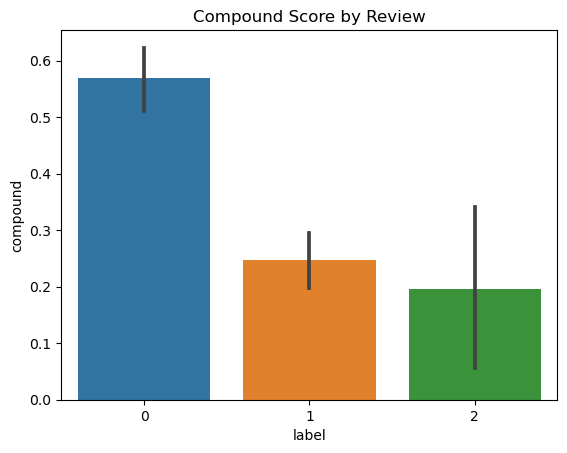

In [92]:
ax = sns.barplot(data=vaders, x='label', y='compound')
ax.set_title('Compound Score by Review')
plt.show()

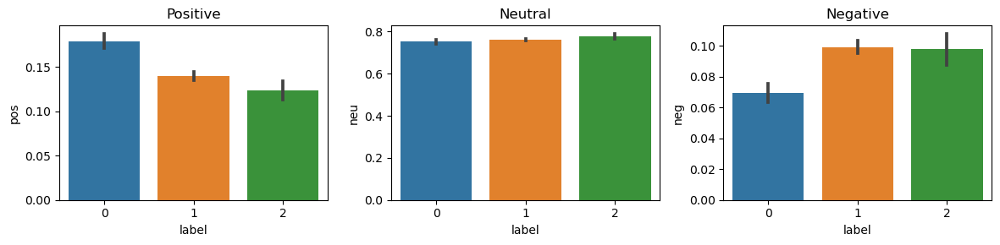

In [93]:
fig, axs = plt.subplots(1, 3, figsize=(12, 3))
sns.barplot(data=vaders, x='label', y='pos', ax=axs[0])
sns.barplot(data=vaders, x='label', y='neu', ax=axs[1])
sns.barplot(data=vaders, x='label', y='neg', ax=axs[2])

axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

#Insight 4:Negative Helpfullness = positive sentiment, Negative helpfullness = negative helpfullness Berdasarkan isi konten review

In [94]:
res2 = {}
for i, row in tqdm(dfh.iterrows(), total=len(dfh)):
    text1 = row['user_title_review']
    myid1 = row['index']
    res2[myid1] = sia.polarity_scores(text1)

  0%|          | 0/1488 [00:00<?, ?it/s]

In [95]:
vaders2 = pd.DataFrame(res2).T
vaders2 = vaders2.reset_index()
vaders2 = vaders2.merge(dfh, how='left')

In [96]:
vaders2[['neg','neu','pos','label']]

,neg,neu,pos,label
0,0.000,1.000,0.000,2
1,0.000,1.000,0.000,2
2,0.000,1.000,0.000,2
3,0.000,0.599,0.401,2
4,0.445,0.555,0.000,2
...,...,...,...,...
1483,0.000,0.408,0.592,0
1484,0.000,0.568,0.432,0
1485,0.000,0.545,0.455,0
1486,0.697,0.303,0.000,0


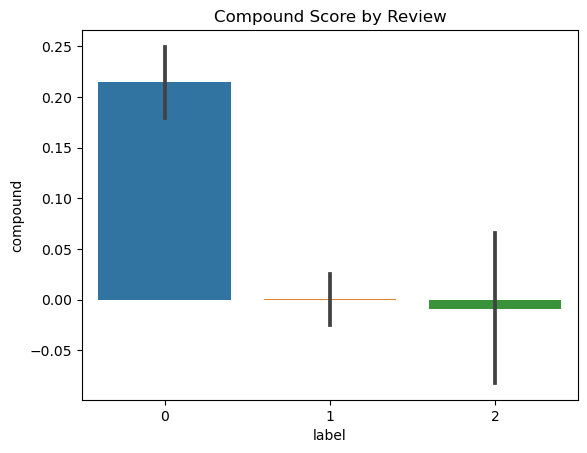

In [97]:
ax = sns.barplot(data=vaders2, x='label', y='compound')
ax.set_title('Compound Score by Review')
plt.show()

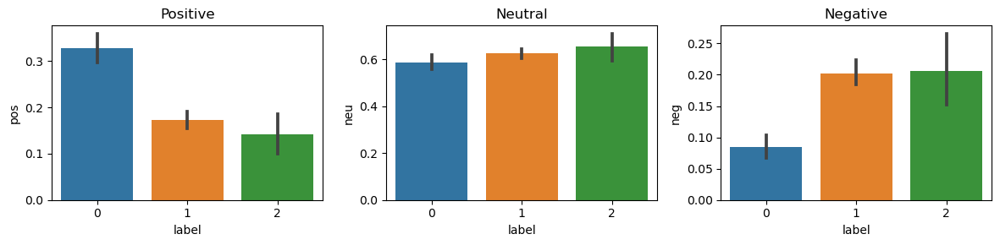

In [98]:
fig, axs = plt.subplots(1, 3, figsize=(12, 3))
sns.barplot(data=vaders2, x='label', y='pos', ax=axs[0])
sns.barplot(data=vaders2, x='label', y='neu', ax=axs[1])
sns.barplot(data=vaders2, x='label', y='neg', ax=axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

#Insight 5: Sentiment Positive cenderung label 0, label 1 cenderung netral, label 2 cenderung sentiment netral dan negative

In [99]:
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

In [100]:
print(example)
sia.polarity_scores(example)

Game of Thrones was special. It had families from all over a fantasy world. The families had likeable characters who you routed for. It had the wall, the nights watch, dragons, and MAGIC to top it all. Each character was interesting and then the show really took off when the character's storylines started to intertwine.House of the Dragon, simply has dragons. I'm not sure who to route for, it's almost a show made up of villains. Maybe that's the point? Either way, where is the magic? One house is not enough to make me look forward to future seasons. The show is really well made, and it's fun to watch, but in the end it's kind of forgettable. This show is good, but not special.


{'neg': 0.031, 'neu': 0.832, 'pos': 0.138, 'compound': 0.9105}

In [101]:
encoded_text = tokenizer(example, return_tensors='pt')
output = model(**encoded_text)
scores = output[0][0].detach().numpy()
scores = softmax(scores)
scores_dict = {
    'roberta_neg' : scores[0],
    'roberta_neu' : scores[1],
    'roberta_pos' : scores[2]
}
print(scores_dict)

{'roberta_neg': 0.09932557, 'roberta_neu': 0.2943963, 'roberta_pos': 0.6062781}


In [102]:
def polarity_scores_roberta(example):
    encoded_text = tokenizer(example, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
        'roberta_neg' : scores[0],
        'roberta_neu' : scores[1],
        'roberta_pos' : scores[2]
    }
    return scores_dict

In [103]:
res = {}
for i, row in tqdm(dfh.iterrows(), total=len(dfh)):
    try:
        text = row['user_title_review_content']
        myid = row['index']
        vader_result = sia.polarity_scores(text)
        vader_result_rename = {}
        for key, value in vader_result.items():
            vader_result_rename[f"vader_{key}"] = value
        roberta_result = polarity_scores_roberta(text)
        both = {**vader_result_rename, **roberta_result}
        res[myid] = both
    except RuntimeError:
        print(f'Broke for id {myid}')

  0%|          | 0/1488 [00:00<?, ?it/s]

Broke for id 7
Broke for id 27
Broke for id 37
Broke for id 39
Broke for id 61
Broke for id 80
Broke for id 123
Broke for id 129
Broke for id 145
Broke for id 177
Broke for id 211
Broke for id 245
Broke for id 250
Broke for id 311
Broke for id 366
Broke for id 412
Broke for id 465
Broke for id 542
Broke for id 564
Broke for id 631
Broke for id 684
Broke for id 697
Broke for id 714
Broke for id 755
Broke for id 812
Broke for id 878
Broke for id 885
Broke for id 934
Broke for id 945
Broke for id 965
Broke for id 988
Broke for id 1002
Broke for id 1005
Broke for id 1051
Broke for id 1143
Broke for id 1278
Broke for id 1418
Broke for id 1449
Broke for id 1474


In [104]:
results_df = pd.DataFrame(res).T
results_df = results_df.reset_index()
results_df = results_df.merge(dfh, how='left')

In [105]:
results_df[['roberta_neg','roberta_neu','roberta_pos','label']]

,roberta_neg,roberta_neu,roberta_pos,label
0,0.004424,0.058702,0.936874,2
1,0.001506,0.009406,0.989088,2
2,0.344406,0.431450,0.224144,2
3,0.030912,0.279349,0.689740,2
4,0.008708,0.033277,0.958015,2
...,...,...,...,...
1444,0.005742,0.346120,0.648137,0
1445,0.310355,0.324698,0.364948,0
1446,0.352298,0.367636,0.280066,0
1447,0.355788,0.345268,0.298944,0


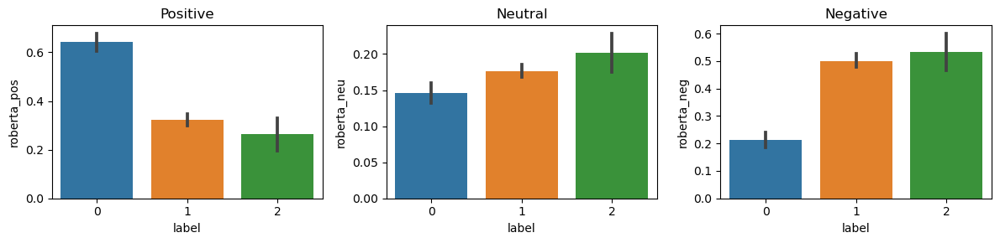

In [106]:
fig, axs = plt.subplots(1, 3, figsize=(12, 3))
sns.barplot(data=results_df, x='label', y='roberta_pos', ax=axs[0])
sns.barplot(data=results_df, x='label', y='roberta_neu', ax=axs[1])
sns.barplot(data=results_df, x='label', y='roberta_neg', ax=axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

#INsight 6: Negative Helpfullness = positive sentiment, positive helpfullness = negative sentiment berdasarkan content

In [107]:
res = {}
for i, row in tqdm(dfh.iterrows(), total=len(dfh)):
    try:
        text = row['user_title_review']
        myid = row['index']
        vader_result = sia.polarity_scores(text)
        vader_result_rename = {}
        for key, value in vader_result.items():
            vader_result_rename[f"vader_{key}"] = value
        roberta_result = polarity_scores_roberta(text)
        both = {**vader_result_rename, **roberta_result}
        res[myid] = both
    except RuntimeError:
        print(f'Broke for id {myid}')

  0%|          | 0/1488 [00:00<?, ?it/s]

In [108]:
results_df1 = pd.DataFrame(res).T
results_df1 = results_df.reset_index()
results_df1 = results_df.merge(dfh, how='left')

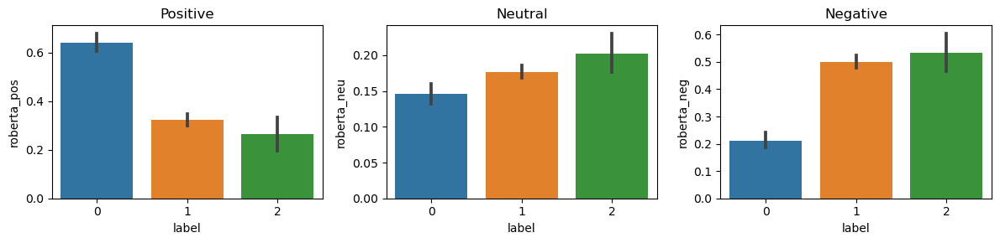

In [109]:
fig, axs = plt.subplots(1, 3, figsize=(12, 3))
sns.barplot(data=results_df1, x='label', y='roberta_pos', ax=axs[0])
sns.barplot(data=results_df1, x='label', y='roberta_neu', ax=axs[1])
sns.barplot(data=results_df1, x='label', y='roberta_neg', ax=axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

# sama aja

In [110]:
results_df.columns

Index(['index', 'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound',
       'roberta_neg', 'roberta_neu', 'roberta_pos', 'rating',
       'user_title_review', 'user_title_review_content', 'title_word_count',
       'content_word_count', 'helpfullness_percentage', 'label',
       'num_adjectives_title', 'num_adjectives_content', 'num_noun_title',
       'num_noun_content', 'num_adverb_title', 'num_adverb_content',
       'num_determiner_title', 'num_determiner_content', 'num_verb_title',
       'num_verb_content'],
      dtype='object')

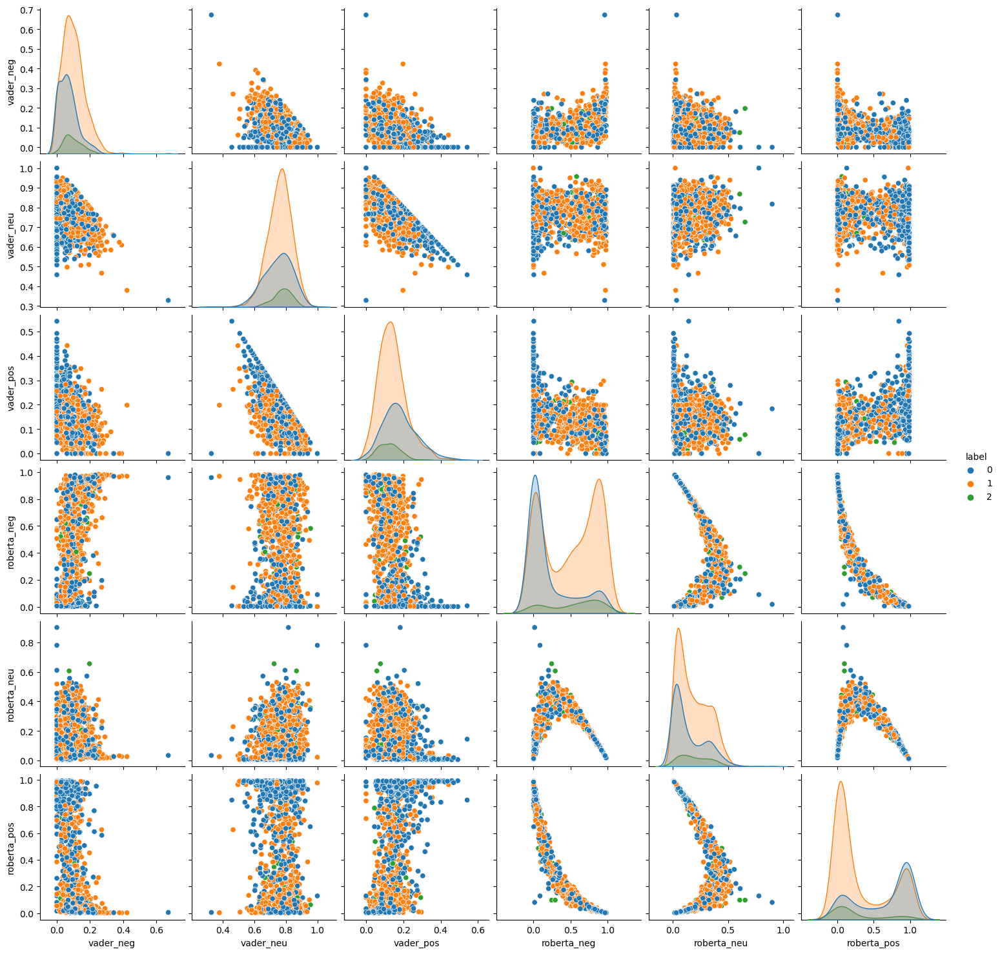

In [111]:
sns.pairplot(data=results_df,
             vars=['vader_neg', 'vader_neu', 'vader_pos',
                  'roberta_neg', 'roberta_neu', 'roberta_pos'],
            hue='label',
            palette='tab10')
plt.show()

In [112]:
results_df.query('label == 0') \
    .sort_values('roberta_pos', ascending=False)['user_title_review_content'].values[2]

"Spoiler Free reviewThis is everything I wanted, and more! I'm so glad that it was kicked off right from the start! The brutality was amped up!!!! I can already tell Matt Smith's Daemon and Milly Alcock's portrayal of Rhaneyra are amazing thus far. It's a fire breathing breath of fresh air. So lovely to return to the world of GoT."

In [113]:
results_df.query('label == 1') \
    .sort_values('roberta_pos', ascending=False)['user_title_review_content'].values[0]

"This is an amazing show that takes some of my favorite aspects of Game of Thrones, and builds up on them in a magnificent way. Dialogue is great, cinematography and visual effects are stunning. It is a faithful adaptation that book readers will love. Fantastic first episode that makes me exited for more. It's great to be back in Westeros."

In [114]:
results_df.query('label == 2') \
    .sort_values('roberta_neg', ascending=False)['user_title_review_content'].values[5]

"This is the most boring and confusing bs I have ever watched. I watched GOT 3 times over. And still! Just what I wanted... a show where I have to get online and figure the **** out who everybody is while I watch it. Never knew just what I needed was too rewind 42 times because I missed something, on account uh, I'm also doing research.... There is no comedy, my dad hates that the most, Tyrion, the Hound right off the top of my head, hilarious! I get we're going back even further, and the ages are getting darker. But I haven't laughed one time watching this, it's hard on account uh, how dull it is. If this gets any worse or stays as bad as it is just call it. Wait till dude writes a couple more books then bring back GOT."

In [115]:
from transformers import pipeline

sent_pipeline = pipeline("sentiment-analysis")

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


In [116]:
sent_pipeline('I dont even know how to describe how much I loved House of Dragon. First of all, Game of Thrones is my favorite show of all time. I love it so much Ive watched it all the way through several times and will again. I was hoping House of Dragon would be half as good. Well, its more than that. Its not quite as good as Game of Thrones but its pretty darn close. Its definitely the best new show thats come out in years. Im glad it was nominated for a bunch of Emmys including best drama, it didnt win but glad to see the show is getting the love it deserves. The entire cast is unbelievable, not a bad actor on the entire show.')

[{'label': 'POSITIVE', 'score': 0.9996515512466431}]

In [117]:
sent_pipeline("The series seems to be the most influential derivative in the world, and its concepts combined and integrated in the writing seem unusually strong, and the application of events, the course of events, and the political escalation are unparalleled, and the CGI was very beautiful, and in episode 2 it was a review of the CGI, photography, and the series HOUSE OF THE DRAGON. It literally revived the hope and passion of everyone who was disappointed by the end of Game of Thrones. HOUSE OF THE DRAGON is more than a derivative series. It is a revival of the world of A Song of Ice and Fire. I give it a rating of 10/10 because it deserves that.")


[{'label': 'POSITIVE', 'score': 0.9996999502182007}]

In [118]:
sent_pipeline('fuc')

[{'label': 'NEGATIVE', 'score': 0.9992119073867798}]

PR:buat model dan pipeline

Pre Processing

In [119]:
corpustitle = []
stemmer = PorterStemmer()
# Loop through each review in the DataFrame
for i in range(dfh.shape[0]):
    review = re.sub('[^a-zA-Z]', ' ', dfh.iloc[i]['user_title_review'])  # Remove non-letter characters
    review = review.lower().split()  # Convert to lowercase and split into words
    review = [stemmer.stem(word) for word in review if word not in STOPWORDS]  # Remove stop words and apply stemming
    review = ' '.join(review)  # Join words back into a single string
    corpustitle.append(review)

# Assign the processed corpuscontent back to the DataFrame
dfh['user_title_review'] = corpustitle

corpuscontent = []
stemmer = PorterStemmer()
# Loop through each review in the DataFrame
for i in range(dfh.shape[0]):
    review = re.sub('[^a-zA-Z]', ' ', dfh.iloc[i]['user_title_review_content'])  # Remove non-letter characters
    review = review.lower().split()  # Convert to lowercase and split into words
    review = [stemmer.stem(word) for word in review if word not in STOPWORDS]  # Remove stop words and apply stemming
    review = ' '.join(review)  # Join words back into a single string
    corpuscontent.append(review)

# Assign the processed corpuscontent back to the DataFrame
dfh['user_title_review_content'] = corpuscontent


In [120]:
dfh

,index,rating,user_title_review,user_title_review_content,title_word_count,content_word_count,helpfullness_percentage,label,num_adjectives_title,num_adjectives_content,num_noun_title,num_noun_content,num_adverb_title,num_adverb_content,num_determiner_title,num_determiner_content,num_verb_title,num_verb_content
0,0,8,past erupt,mythic kingdom raw natur human qualiti shape r...,4,104,78.02,2,1,15,1,34,0,4,1,13,0,12
1,1,9,fantasi done right,refresh know still studio capabl sf fantasi sh...,3,125,82.14,2,0,9,2,27,0,10,0,12,1,31
2,2,6,incohes,first episod quit promis thought initi cast in...,1,223,69.61,2,1,18,0,47,0,25,0,31,0,41
3,3,10,entertain second season show absolut fantast,complex hous dragon season truli remark hbomax...,12,229,100.00,2,2,22,3,72,1,9,3,29,1,32
4,4,10,good got still good,game throne one favorit show time wait hous dr...,8,171,84.85,2,2,15,1,29,3,19,0,19,0,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1483,1483,5,good far,hous dragon good start incred show would produ...,3,123,10.53,0,0,5,1,43,2,2,0,18,0,18
1484,1484,4,wow one big english soap opra,love got would rate hod honestli struggl get s...,6,126,14.29,0,1,10,4,20,0,15,0,11,0,24
1485,1485,5,want like,realli want like caus ador got unlik got singl...,5,210,0.00,0,0,7,0,46,0,12,0,19,3,43
1486,1486,1,bore start,hope go better becous start episod boooooor mo...,2,44,0.00,0,1,5,1,9,0,6,0,3,0,13


PR: jadi buat beberapa model, buat user_title_review sm yg content dibuat model masing masing, trus yang sisanya dibuat model juga (jadi ada 3 model) trus 3 model disatuin

Preprocessing: coba handling outlier, distribusi data, skewness

In [121]:
cv = CountVectorizer(max_features = 1000)
corpus = dfh['user_title_review_content'].tolist()  # Mengambil teks yang sudah dipreprocessing
corpus1 = dfh['user_title_review'].tolist()  # Mengambil teks yang sudah dipreprocessing
a = cv.fit_transform(corpus).toarray()
b = cv.fit_transform(corpus1).toarray()


In [122]:
#Storing independent and dependent variables in X and y
X = a
X1 = b
X2 = dfh[['rating','title_word_count','content_word_count','num_adjectives_title','num_adjectives_content','num_noun_title','num_noun_content','num_adverb_title','num_adverb_content','num_determiner_title','num_determiner_content','num_verb_title','num_verb_content']]
y = dfh['label'].values

In [123]:
directory = "Models"
if not os.path.exists(directory):
    os.makedirs(directory)

In [124]:
pickle.dump(cv, open('Models/countVectorizer.pkl', 'wb'))

In [125]:
print(f"X shape: {X.shape}")
print(f"X1 shape: {X1.shape}")
print(f"X2 shape: {X2.shape}")
print(f"y shape: {y.shape}")

X shape: (1488, 1000)
X1 shape: (1488, 1000)
X2 shape: (1488, 13)
y shape: (1488,)


In [126]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 15)

print(f"X train: {X_train.shape}")
print(f"y train: {y_train.shape}")
print(f"X test: {X_test.shape}")
print(f"y test: {y_test.shape}")

X train: (1041, 1000)
y train: (1041,)
X test: (447, 1000)
y test: (447,)


In [127]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y, test_size = 0.3, random_state = 15)

print(f"X train: {X1_train.shape}")
print(f"y train: {y1_train.shape}")
print(f"X test: {X1_test.shape}")
print(f"y test: {y1_test.shape}")

X train: (1041, 1000)
y train: (1041,)
X test: (447, 1000)
y test: (447,)


In [128]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y, test_size = 0.3, random_state = 15)

print(f"X train: {X2_train.shape}")
print(f"y train: {y2_train.shape}")
print(f"X test: {X2_test.shape}")
print(f"y test: {y2_test.shape}")

X train: (1041, 13)
y train: (1041,)
X test: (447, 13)
y test: (447,)


In [129]:
print(f"X train max value: {X_train.max()}")
print(f"X test max value: {X_test.max()}")
print(f"X train max value: {X1_train.max()}")
print(f"X test max value: {X1_test.max()}")
print(f"X train max value: {X2_train.max()}")
print(f"X test max value: {X2_test.max()}")


X train max value: 28
X test max value: 24
X train max value: 4
X test max value: 5
X train max value: rating                      10
title_word_count            23
content_word_count        1214
num_adjectives_title         4
num_adjectives_content      83
num_noun_title               8
num_noun_content           327
num_adverb_title             4
num_adverb_content         104
num_determiner_title         4
num_determiner_content     142
num_verb_title               5
num_verb_content           213
dtype: int64
X test max value: rating                      10
title_word_count            25
content_word_count        1654
num_adjectives_title         4
num_adjectives_content     146
num_noun_title              10
num_noun_content           467
num_adverb_title             4
num_adverb_content         124
num_determiner_title         3
num_determiner_content     176
num_verb_title               6
num_verb_content           269
dtype: int64


In [130]:
scaler = MinMaxScaler()

X_train_scl = scaler.fit_transform(X_train)
X_test_scl = scaler.transform(X_test)

In [131]:
X_train_scl1 = scaler.fit_transform(X1_train)
X_test_scl1 = scaler.transform(X1_test)

In [132]:
X_train_scl2 = scaler.fit_transform(X2_train)
X_test_scl2 = scaler.transform(X2_test)

In [133]:
pickle.dump(scaler, open('Models/scaler.pkl', 'wb'))

Random Forest

In [134]:
model_rf = RandomForestClassifier()
model_rf.fit(X_train, y_train)

RandomForestClassifier()

In [135]:
model_rf.fit(X1_train, y1_train)

RandomForestClassifier()

In [136]:
#model_rf.fit(X2_train, y2_train)

In [137]:
print("Training Accuracy :", model_rf.score(X_train_scl, y_train))
print("Testing Accuracy :", model_rf.score(X_test_scl, y_test))
print("Training Accuracy :", model_rf.score(X_train_scl1, y1_train))
print("Testing Accuracy :", model_rf.score(X_test_scl1, y1_test))
#print("Training Accuracy :", model_rf.score(X_train_scl2, y2_train))
#print("Testing Accuracy :", model_rf.score(X_test_scl2, y2_test))

Training Accuracy : 0.4687800192122959
Testing Accuracy : 0.41834451901565994
Training Accuracy : 0.8587896253602305
Testing Accuracy : 0.5257270693512305


In [138]:
y_preds = model_rf.predict(X_test_scl)
y_preds1 = model_rf.predict(X_test_scl1)

In [139]:

#y_preds2 = model_rf.predict(X_test_scl2)

In [140]:
cm = confusion_matrix(y_test, y_preds)
cm1 = confusion_matrix(y1_test, y_preds1)

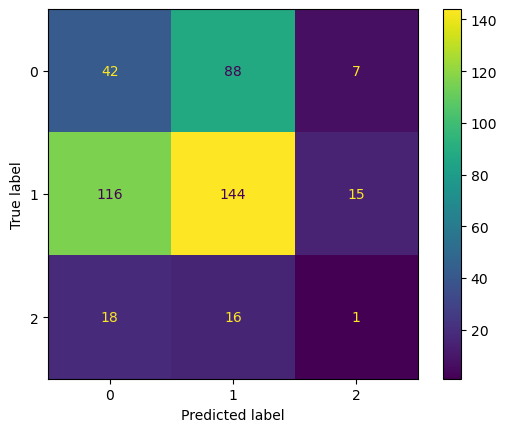

In [141]:
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model_rf.classes_)
cm_display.plot()
plt.show()

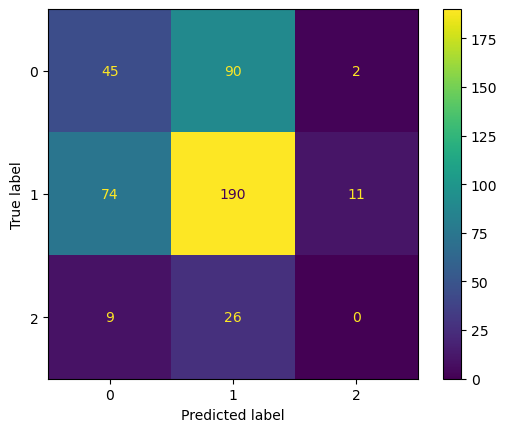

In [142]:
cm_display1 = ConfusionMatrixDisplay(confusion_matrix=cm1,display_labels=model_rf.classes_)
cm_display1.plot()
plt.show()

K Fold cross validation

In [143]:
accuracies = cross_val_score(estimator = model_rf, X = X_train_scl, y = y_train, cv = 10)
accuracies1 = cross_val_score(estimator = model_rf, X = X_train_scl1, y = y1_train, cv = 10)

print("Accuracy :", accuracies.mean())
print("Standard Variance :", accuracies.std())
print("Accuracy :", accuracies1.mean())
print("Standard Variance :", accuracies1.std())

KeyboardInterrupt: 

Applying grid search to get the optimal parameters on random forest

In [ ]:
params = {
    'bootstrap': [True],
    'max_depth': [80, 100],
    'min_samples_split': [8, 12],
    'n_estimators': [100, 300]
}

In [ ]:
cv_object = StratifiedKFold(n_splits = 2)

grid_search = GridSearchCV(estimator = model_rf, param_grid = params, cv = cv_object, verbose = 0, return_train_score = True)
grid_search.fit(X_train_scl, y_train.ravel())


GridSearchCV(cv=StratifiedKFold(n_splits=2, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True], 'max_depth': [80, 100],
                         'min_samples_split': [8, 12],
                         'n_estimators': [100, 300]},
             return_train_score=True)

In [ ]:
grid_search1 = GridSearchCV(estimator = model_rf, param_grid = params, cv = cv_object, verbose = 0, return_train_score = True)
grid_search1.fit(X_train_scl1, y1_train.ravel())

GridSearchCV(cv=StratifiedKFold(n_splits=2, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True], 'max_depth': [80, 100],
                         'min_samples_split': [8, 12],
                         'n_estimators': [100, 300]},
             return_train_score=True)

In [ ]:
#Getting the best parameters from the grid search
print("Best Parameter Combination : {}".format(grid_search.best_params_))
print("Best Parameter Combination : {}".format(grid_search1.best_params_))

Best Parameter Combination : {'bootstrap': True, 'max_depth': 80, 'min_samples_split': 8, 'n_estimators': 300}
Best Parameter Combination : {'bootstrap': True, 'max_depth': 80, 'min_samples_split': 12, 'n_estimators': 100}


In [ ]:
print("Cross validation mean accuracy on train set : {}".format(grid_search.cv_results_['mean_train_score'].mean()*100))
print("Cross validation mean accuracy on test set : {}".format(grid_search.cv_results_['mean_test_score'].mean()*100))
print("Accuracy score for test set :", accuracy_score(y_test, y_preds))

Cross validation mean accuracy on train set : 98.69096504503175
Cross validation mean accuracy on test set : 63.49607356415178
Accuracy score for test set : 0.40939597315436244


In [ ]:
print("Cross validation mean accuracy on train set : {}".format(grid_search1.cv_results_['mean_train_score'].mean()*100))
print("Cross validation mean accuracy on test set : {}".format(grid_search1.cv_results_['mean_test_score'].mean()*100))
print("Accuracy score for test set :", accuracy_score(y1_test, y_preds1))

Cross validation mean accuracy on train set : 87.58404233722132
Cross validation mean accuracy on test set : 62.499838513214236
Accuracy score for test set : 0.5100671140939598


XGBoost

In [ ]:
model_xgb = XGBClassifier()
model_xgb.fit(X_train_scl, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
model_xgb.fit(X_train_scl1, y1_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
#Accuracy of the model on training and testing data
 
print("Training Accuracy :", model_xgb.score(X_train_scl, y_train))
print("Testing Accuracy :", model_xgb.score(X_test_scl, y_test))

Training Accuracy : 0.553314121037464
Testing Accuracy : 0.5682326621923938


In [ ]:
#Accuracy of the model on training and testing data
 
print("Training Accuracy :", model_xgb.score(X_train_scl1, y1_train))
print("Testing Accuracy :", model_xgb.score(X_test_scl1, y1_test))

Training Accuracy : 0.7492795389048992
Testing Accuracy : 0.6062639821029083


In [ ]:
y_preds = model_xgb.predict(X_test)
#Confusion Matrix
cm = confusion_matrix(y_test, y_preds)
print(cm)

[[ 41  82  14]
 [ 87 162  26]
 [ 14  18   3]]


In [ ]:
y_preds1 = model_xgb.predict(X1_test)
#Confusion Matrix
cm1 = confusion_matrix(y1_test, y_preds1)
print(cm1)

[[ 36 101   0]
 [ 40 231   4]
 [  4  31   0]]


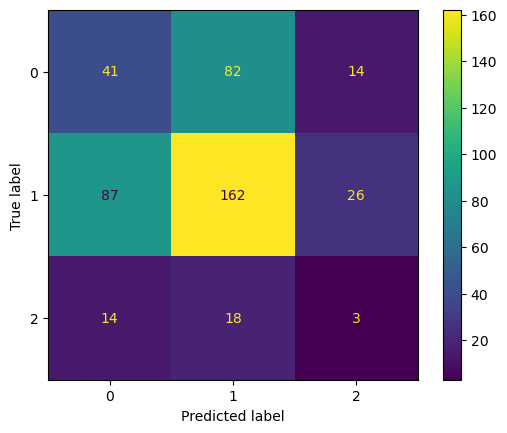

In [ ]:
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model_xgb.classes_)
cm_display.plot()
plt.show()

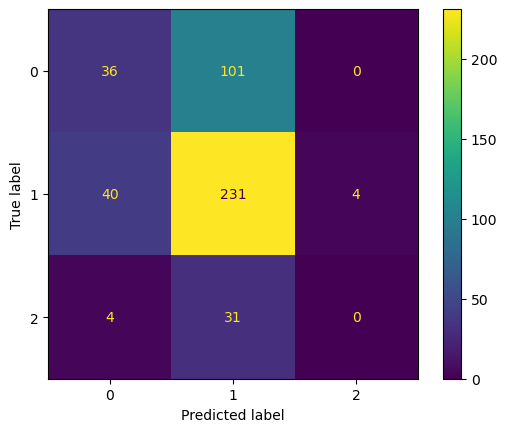

In [ ]:
cm_display1 = ConfusionMatrixDisplay(confusion_matrix=cm1,display_labels=model_xgb.classes_)
cm_display1.plot()
plt.show()

DecisionTree

In [ ]:
model_dt = DecisionTreeClassifier()
model_dt.fit(X_train_scl, y_train)

DecisionTreeClassifier()

In [ ]:
model_dt.fit(X_train_scl1, y1_train)

DecisionTreeClassifier()

In [ ]:
#Accuracy of the model on training and testing data
 
print("Training Accuracy :", model_dt.score(X_train_scl, y_train))
print("Testing Accuracy :", model_dt.score(X_test_scl, y_test))

Training Accuracy : 0.42843419788664744
Testing Accuracy : 0.39149888143176736


In [ ]:
#Accuracy of the model on training and testing data
 
print("Training Accuracy :", model_dt.score(X_train_scl1, y1_train))
print("Testing Accuracy :", model_dt.score(X_test_scl1, y1_test))

Training Accuracy : 0.9365994236311239
Testing Accuracy : 0.47651006711409394


In [ ]:
y_preds = model_dt.predict(X_test)
y_preds1 = model_dt.predict(X1_test)


In [ ]:
#Confusion Matrix
cm = confusion_matrix(y_test, y_preds)
print(cm)

[[ 99  14  24]
 [204  25  46]
 [ 26   3   6]]


In [ ]:
#Confusion Matrix
cm1 = confusion_matrix(y1_test, y_preds1)
print(cm1)

[[ 57  79   1]
 [102 151  22]
 [  9  24   2]]


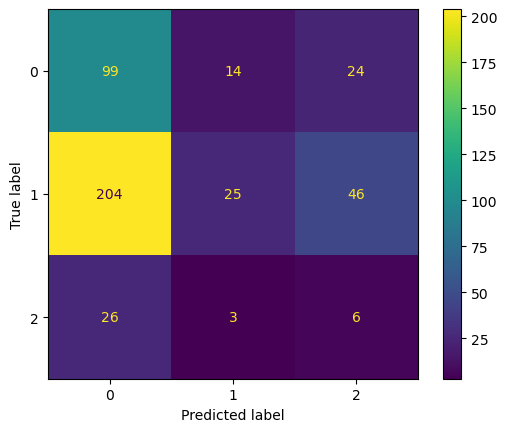

In [ ]:
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model_dt.classes_)
cm_display.plot()
plt.show()

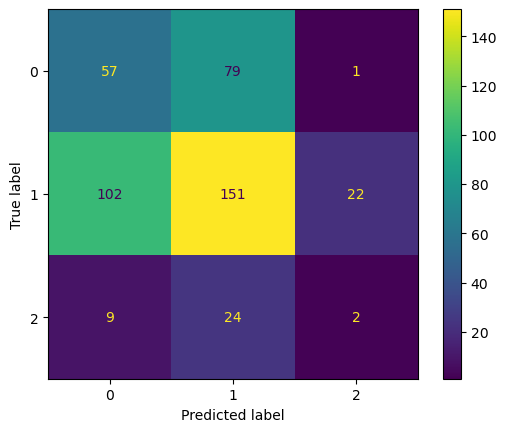

In [ ]:
cm_display1 = ConfusionMatrixDisplay(confusion_matrix=cm1,display_labels=model_dt.classes_)
cm_display1.plot()
plt.show()

In [ ]:
training_score = []
testing_score = []
def model_prediction(model):
    model.fit(X_train_scl2,y2_train)
    X2_train_pred = model.predict(X_train_scl2)
    X2_test_pred = model.predict(X_test_scl2)
    a = accuracy_score(y2_train,X2_train_pred)*100
    b = accuracy_score(y2_test,X2_test_pred)*100
    training_score.append(a)
    testing_score.append(b)
    
    print(f"Accuracy_Score of {model} model on Training Data is:",a)
    print(f"Accuracy_Score of {model} model on Testing Data is:",b)
    print("\n------------------------------------------------------------------------")
    print(f"Precision Score of {model} model is:",precision_score(y2_test,X2_test_pred,average='weighted'))
    print(f"Recall Score of {model} model is:",recall_score(y2_test,X2_test_pred,average='weighted'))
    print(f"F1 Score of {model} model is:",f1_score(y2_test,X2_test_pred,average='weighted'))
    print("\n------------------------------------------------------------------------")
    print(f"Confusion Matrix of {model} model is:")
    cm = confusion_matrix(y2_test,X2_test_pred)
    plt.figure(figsize=(8,4))
    sns.heatmap(cm,annot=True,fmt="g",cmap="summer")
    plt.show()

c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy_Score of KNeighborsClassifier() model on Training Data is: 72.52641690682037
Accuracy_Score of KNeighborsClassifier() model on Testing Data is: 62.41610738255034

------------------------------------------------------------------------
Precision Score of KNeighborsClassifier() model is: 0.5755941202395828
Recall Score of KNeighborsClassifier() model is: 0.6241610738255033
F1 Score of KNeighborsClassifier() model is: 0.5961592917643583

------------------------------------------------------------------------
Confusion Matrix of KNeighborsClassifier() model is:


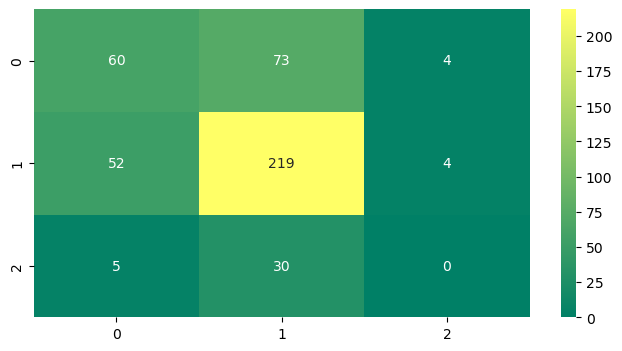

In [ ]:
model_prediction(KNeighborsClassifier())

Accuracy_Score of GaussianNB() model on Training Data is: 61.95965417867435
Accuracy_Score of GaussianNB() model on Testing Data is: 60.85011185682326

------------------------------------------------------------------------
Precision Score of GaussianNB() model is: 0.6034536489810456
Recall Score of GaussianNB() model is: 0.6085011185682326
F1 Score of GaussianNB() model is: 0.6041383533119807

------------------------------------------------------------------------
Confusion Matrix of GaussianNB() model is:


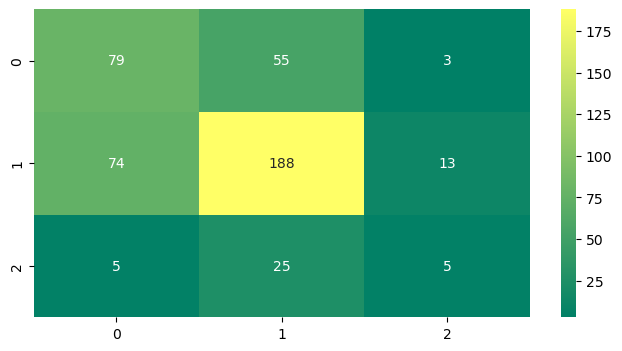

In [ ]:
model_prediction(GaussianNB())

Accuracy_Score of SVC() model on Training Data is: 68.87608069164266
Accuracy_Score of SVC() model on Testing Data is: 64.42953020134227

------------------------------------------------------------------------
Precision Score of SVC() model is: 0.5819758892760488
Recall Score of SVC() model is: 0.6442953020134228
F1 Score of SVC() model is: 0.6040431508567939

------------------------------------------------------------------------
Confusion Matrix of SVC() model is:


c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


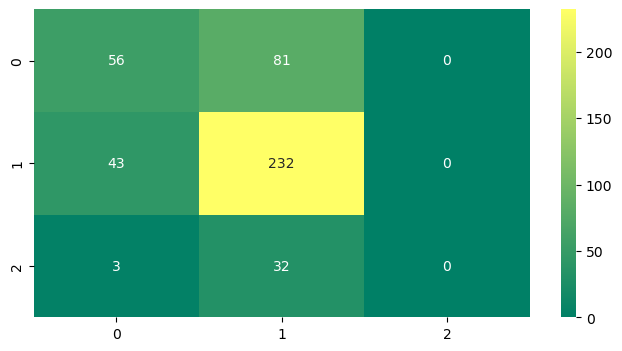

In [ ]:
model_prediction(SVC())

Accuracy_Score of DecisionTreeClassifier() model on Training Data is: 100.0
Accuracy_Score of DecisionTreeClassifier() model on Testing Data is: 53.02013422818792

------------------------------------------------------------------------
Precision Score of DecisionTreeClassifier() model is: 0.528622221498486
Recall Score of DecisionTreeClassifier() model is: 0.5302013422818792
F1 Score of DecisionTreeClassifier() model is: 0.5292324347983988

------------------------------------------------------------------------
Confusion Matrix of DecisionTreeClassifier() model is:


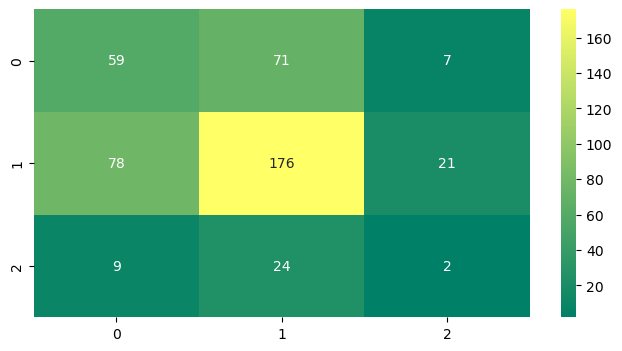

In [ ]:
model_prediction(DecisionTreeClassifier())

Accuracy_Score of RandomForestClassifier() model on Training Data is: 100.0
Accuracy_Score of RandomForestClassifier() model on Testing Data is: 64.87695749440716

------------------------------------------------------------------------
Precision Score of RandomForestClassifier() model is: 0.5875881688340332
Recall Score of RandomForestClassifier() model is: 0.6487695749440716
F1 Score of RandomForestClassifier() model is: 0.6046286484294255

------------------------------------------------------------------------
Confusion Matrix of RandomForestClassifier() model is:


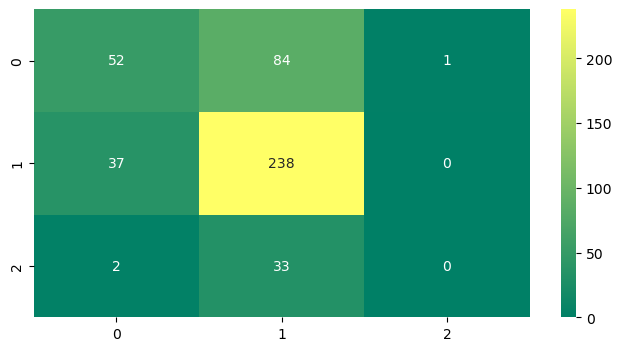

In [ ]:
model_prediction(RandomForestClassifier())

Accuracy_Score of AdaBoostClassifier() model on Training Data is: 62.2478386167147
Accuracy_Score of AdaBoostClassifier() model on Testing Data is: 63.758389261744966

------------------------------------------------------------------------
Precision Score of AdaBoostClassifier() model is: 0.6015087501185296
Recall Score of AdaBoostClassifier() model is: 0.6375838926174496
F1 Score of AdaBoostClassifier() model is: 0.6062425481178674

------------------------------------------------------------------------
Confusion Matrix of AdaBoostClassifier() model is:


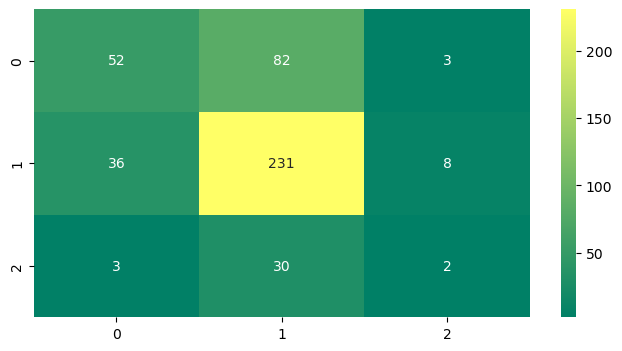

In [ ]:
model_prediction(AdaBoostClassifier())

Accuracy_Score of GradientBoostingClassifier() model on Training Data is: 83.09317963496638
Accuracy_Score of GradientBoostingClassifier() model on Testing Data is: 62.86353467561522

------------------------------------------------------------------------
Precision Score of GradientBoostingClassifier() model is: 0.5897712643955649
Recall Score of GradientBoostingClassifier() model is: 0.6286353467561522
F1 Score of GradientBoostingClassifier() model is: 0.599351397872499

------------------------------------------------------------------------
Confusion Matrix of GradientBoostingClassifier() model is:


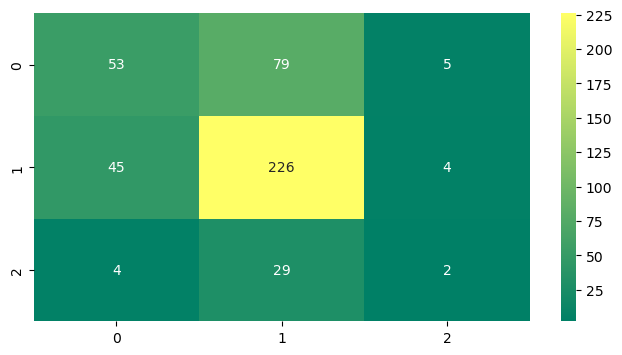

In [ ]:
model_prediction(GradientBoostingClassifier())

In [ ]:
pred_test_content = grid_search.predict(X_test_scl)
pred_test_title = grid_search1.predict(X_test_scl1)

In [ ]:
pred_train_content = grid_search.predict(X_train_scl)
pred_train_title = grid_search1.predict(X_train_scl1)

In [ ]:
modelfeature = GradientBoostingClassifier()
modelfeature.fit(X_train_scl2,y2_train)
pred_train_feature = modelfeature.predict(X_train_scl2)
pred_test_feature = modelfeature.predict(X_test_scl2)

In [ ]:
meta_features_train = pd.DataFrame({
    'pred_train_content': pred_train_content,
    'pred_train_title': pred_train_title,
    'pred_train_feature': pred_train_feature
})

In [ ]:
meta_features_test = pd.DataFrame({
    'pred_test_content': pred_test_content,
    'pred_test_title': pred_test_title,
    'pred_test_feature': pred_test_feature
})

In [ ]:
meta_model = RandomForestClassifier()
meta_model.fit(meta_features_train, y_train)
final_predictions = meta_model.predict(meta_features_test)

c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- pred_test_content
- pred_test_feature
- pred_test_title
Feature names seen at fit time, yet now missing:
- pred_train_content
- pred_train_feature
- pred_train_title

  warnings.warn(message, FutureWarning)


In [ ]:
accuracy = accuracy_score(y_test, final_predictions)
print(f'Akurasi: {accuracy:.2f}')

print("\nLaporan Klasifikasi:")
print(classification_report(y_test, final_predictions))

print("\nMatriks Kebingungan:")
print(confusion_matrix(y_test, final_predictions))

Akurasi: 0.63

Laporan Klasifikasi:
              precision    recall  f1-score   support

           0       0.62      0.18      0.28       137
           1       0.64      0.92      0.76       275
           2       0.15      0.06      0.08        35

    accuracy                           0.63       447
   macro avg       0.47      0.39      0.38       447
weighted avg       0.60      0.63      0.56       447


Matriks Kebingungan:
[[ 25 107   5]
 [ 15 254   6]
 [  0  33   2]]


In [ ]:
meta_model = KNeighborsClassifier()
meta_model.fit(meta_features_train, y_train)
final_predictions = meta_model.predict(meta_features_test)

c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- pred_test_content
- pred_test_feature
- pred_test_title
Feature names seen at fit time, yet now missing:
- pred_train_content
- pred_train_feature
- pred_train_title

  warnings.warn(message, FutureWarning)
c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [ ]:
accuracy = accuracy_score(y_test, final_predictions)
print(f'Akurasi: {accuracy:.2f}')

print("\nLaporan Klasifikasi:")
print(classification_report(y_test, final_predictions))

print("\nMatriks Kebingungan:")
print(confusion_matrix(y_test, final_predictions))

Akurasi: 0.65

Laporan Klasifikasi:
              precision    recall  f1-score   support

           0       0.62      0.27      0.38       137
           1       0.65      0.92      0.76       275
           2       0.00      0.00      0.00        35

    accuracy                           0.65       447
   macro avg       0.42      0.40      0.38       447
weighted avg       0.59      0.65      0.59       447


Matriks Kebingungan:
[[ 37 100   0]
 [ 22 253   0]
 [  1  34   0]]


c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
meta_model = lgb.LGBMClassifier()
meta_model.fit(meta_features_train, y_train)
final_predictions = meta_model.predict(meta_features_test)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9
[LightGBM] [Info] Number of data points in the train set: 1041, number of used features: 3
[LightGBM] [Info] Start training from score -1.167194
[LightGBM] [Info] Start training from score -0.480238
[LightGBM] [Info] Start training from score -2.657478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

In [ ]:
accuracy = accuracy_score(y_test, final_predictions)
print(f'Akurasi: {accuracy:.2f}')

print("\nLaporan Klasifikasi:")
print(classification_report(y_test, final_predictions))

print("\nMatriks Kebingungan:")
print(confusion_matrix(y_test, final_predictions))

Akurasi: 0.63

Laporan Klasifikasi:
              precision    recall  f1-score   support

           0       0.62      0.18      0.28       137
           1       0.64      0.92      0.76       275
           2       0.15      0.06      0.08        35

    accuracy                           0.63       447
   macro avg       0.47      0.39      0.38       447
weighted avg       0.60      0.63      0.56       447


Matriks Kebingungan:
[[ 25 107   5]
 [ 15 254   6]
 [  0  33   2]]
